# Installation and Imports

In [ ]:
!pip install -q "transformers>=4.46.0" "accelerate>=1.1.0" peft datasets


In [ ]:
%pip install -q \
    torch  \
    datasets \
    accelerate \
    numpy \
    pandas \
    scikit-learn \
    matplotlib \
    seaborn \
    wordcloud \
    emoji \
    nltk \
    shap \
    lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.4/608.4 kB 20.1 MB/s eta 0:00:00


In [ ]:
import os, re, sys, random, unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display
from wordcloud import WordCloud

# NLP
import emoji, nltk
from nltk import word_tokenize, pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
for pkg in ["punkt","punkt_tab","averaged_perceptron_tagger","averaged_perceptron_tagger_eng","wordnet","omw-1.4"]:
    nltk.download(pkg, quiet=True)

# ML
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, roc_curve,
    accuracy_score, precision_recall_fscore_support
)

from scipy.sparse import hstack, csr_matrix
# SHAP + LIME
import shap
from lime.lime_text import LimeTextExplainer
from scipy.special import softmax

# TORCH + TRANSFORMERS + PEFT
import torch
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    DataCollatorWithPadding,
    TrainingArguments,
    AutoModelForCausalLM,
    DataCollatorForLanguageModeling,
)

from peft import LoraConfig, get_peft_model, TaskType

# GLOBAL SEED
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print(" SETUP COMPLETE")
print("PyTorch:", torch.__version__)

 SETUP COMPLETE
PyTorch: 2.9.0+cu126


# Initial Data Loading and Cleaning

In [ ]:
def percent_to_float(x):
    if pd.isna(x):
        return np.nan
    if isinstance(x, str):
        x = x.strip()
        if x.endswith("%"):
            x = x[:-1]
        try:
            return float(x)
        except:
            return np.nan
    try:
        return float(x)
    except:
        return np.nan


def drop_unnamed(df):
    return df.loc[:, ~df.columns.str.startswith("Unnamed:")]

def load_and_clean_raw_datasets(base_path="."):
    rmp = pd.read_csv(os.path.join(base_path,
                     "1_He_2020_RMP_v2_with_sampling_criteria.csv"),
                     encoding="latin1", low_memory=False)
    waterloo = pd.read_csv(os.path.join(base_path,
                     "2_Uwaterloo_course_reviews_with_sampling_criteria.csv"),
                     encoding="latin1", low_memory=False)
    exeter = pd.read_csv(os.path.join(base_path,
                     "3_UExeter_uni_reviews_with_sampling_criteria.csv"),
                     encoding="latin1", low_memory=False)

    print("Raw shapes:", rmp.shape, waterloo.shape, exeter.shape)

    rmp = drop_unnamed(rmp)
    waterloo = drop_unnamed(waterloo)
    exeter = drop_unnamed(exeter)

    for df in [rmp, waterloo, exeter]:
        if "num_token" in df.columns:
            df["num_token"] = pd.to_numeric(df["num_token"], errors="coerce")

    if "rating_cat" in rmp.columns:
        rmp = rmp[rmp["rating_cat"].isin(["Pos", "Neg", "Conf/Neu"])]

    if "rating_cat" in waterloo.columns:
        waterloo.loc[waterloo["rating_cat"] == "[NA]", "rating_cat"] = np.nan
        waterloo = waterloo.dropna(subset=["rating_cat"])

    for col in ["useful", "easy", "liked"]:
        if col in waterloo.columns:
            waterloo[col] = waterloo[col].apply(percent_to_float)

    rmp = rmp.reset_index(drop=True)
    waterloo = waterloo.reset_index(drop=True)
    exeter = exeter.reset_index(drop=True)

    print("After cleaning:", rmp.shape, waterloo.shape, exeter.shape)

    return rmp, waterloo, exeter


df_rmp, df_waterloo, df_exeter = load_and_clean_raw_datasets()


Raw shapes: (19145, 96) (14810, 21) (557, 19)
After cleaning: (19144, 14) (14589, 20) (557, 18)


# Unified schema + merged df_all (teacher / course / university)

In [ ]:
UNIFIED_COLS = [
    "global_id",
    "dataset",
    "entity_type",
    "source_id",
    "review_text",
    "rating",
    "rating_bin",
    "rating_cat",
    "num_token",
    "length_bin",
    "sample_criteria",
    "department",
    "teacher_name",
    "course_code",
    "course_name",
    "num_ratings",
    "num_reviews",
    "useful",
    "easy",
    "liked",
    "student_id",
    "date",
    "rating_facilities",
    "rating_clubs",
    "rating_careerService",
    "rating_internet",
]

DEFAULTS = {
    "global_id": "",
    "dataset": "",
    "entity_type": "",
    "source_id": "",
    "review_text": "",
    "rating": 0.0,
    "rating_bin": 0,
    "rating_cat": "unknown",
    "num_token": 0,
    "length_bin": 0,
    "sample_criteria": "unknown",
    "department": "",
    "teacher_name": "",
    "course_code": "",
    "course_name": "",
    "num_ratings": 0,
    "num_reviews": 0,
    "useful": 0.0,
    "easy": 0.0,
    "liked": 0.0,
    "student_id": "",
    "date": "",
    "rating_facilities": 0.0,
    "rating_clubs": 0.0,
    "rating_careerService": 0.0,
    "rating_internet": 0.0,
}


def fill_missing_cols(df, cols, defaults):
    for c in cols:
        if c not in df.columns:
            df[c] = defaults.get(c, "")
    return df[cols]


def build_unified_df(df_rmp, df_waterloo, df_exeter):
    # RMP (teacher)
    rmp_u = pd.DataFrame(index=df_rmp.index)
    rmp_u["dataset"] = "rmp"
    rmp_u["entity_type"] = "teacher"
    rmp_u["source_id"] = df_rmp["id"]
    rmp_u["global_id"] = "rmp_" + df_rmp["id"].astype(str)
    rmp_u["review_text"] = df_rmp["review_text"]
    rmp_u["rating"] = df_rmp["rating"]
    rmp_u["rating_bin"] = df_rmp["rating_bin"]
    rmp_u["rating_cat"] = df_rmp["rating_cat"]
    rmp_u["num_token"] = df_rmp["num_token"]
    rmp_u["length_bin"] = df_rmp["length_bin"]
    rmp_u["sample_criteria"] = df_rmp["sample_criteria"]
    rmp_u["department"] = df_rmp["department"]
    rmp_u["teacher_name"] = df_rmp["teacher_name"]
    rmp_u = fill_missing_cols(rmp_u, UNIFIED_COLS, DEFAULTS)

    # Waterloo (course)
    waterloo_u = pd.DataFrame(index=df_waterloo.index)
    waterloo_u["dataset"] = "waterloo"
    waterloo_u["entity_type"] = "course"
    waterloo_u["source_id"] = df_waterloo["id"]
    waterloo_u["global_id"] = "waterloo_" + df_waterloo["id"].astype(str)
    waterloo_u["review_text"] = df_waterloo["review_text"]
    waterloo_u["rating"] = df_waterloo["rating"]
    waterloo_u["rating_bin"] = df_waterloo["rating_bin"]
    waterloo_u["rating_cat"] = df_waterloo["rating_cat"]
    waterloo_u["num_token"] = df_waterloo.get("num_token", 0)
    waterloo_u["length_bin"] = df_waterloo.get("length_bin", 0)
    waterloo_u["sample_criteria"] = df_waterloo.get("sample_criteria", "unknown")
    waterloo_u["course_code"] = df_waterloo.get("course_code", "")
    waterloo_u["course_name"] = df_waterloo.get("course_id", "")
    waterloo_u["num_ratings"] = df_waterloo.get("num_ratings", 0)
    waterloo_u["num_reviews"] = df_waterloo.get("num_reviews", 0)
    waterloo_u["useful"] = df_waterloo.get("useful", 0.0)
    waterloo_u["easy"] = df_waterloo.get("easy", 0.0)
    waterloo_u["liked"] = df_waterloo.get("liked", 0.0)
    waterloo_u = fill_missing_cols(waterloo_u, UNIFIED_COLS, DEFAULTS)

    # Exeter (university)
    exeter_u = pd.DataFrame(index=df_exeter.index)
    exeter_u["dataset"] = "exeter"
    exeter_u["entity_type"] = "university"
    exeter_u["source_id"] = df_exeter["id"]
    exeter_u["global_id"] = "exeter_" + df_exeter["id"].astype(str)
    exeter_u["review_text"] = df_exeter["review_text"]
    exeter_u["rating"] = df_exeter["rating"]
    exeter_u["rating_bin"] = df_exeter["rating_bin"]
    exeter_u["rating_cat"] = df_exeter["rating_cat"]
    exeter_u["num_token"] = df_exeter.get("num_token", 0)
    exeter_u["length_bin"] = df_exeter.get("length_bin", 0)
    exeter_u["sample_criteria"] = df_exeter.get("sample_criteria", "unknown")
    exeter_u["student_id"] = df_exeter.get("student_id", "")
    exeter_u["date"] = df_exeter.get("date", "")
    exeter_u["rating_facilities"] = df_exeter.get("rating_facilities", 0.0)
    exeter_u["rating_clubs"] = df_exeter.get("rating_clubs", 0.0)
    exeter_u["rating_careerService"] = df_exeter.get("rating_careerService", 0.0)
    exeter_u["rating_internet"] = df_exeter.get("rating_internet", 0.0)
    exeter_u = fill_missing_cols(exeter_u, UNIFIED_COLS, DEFAULTS)

    df_all = pd.concat([rmp_u, waterloo_u, exeter_u], ignore_index=True)
    df_all = df_all[df_all["rating_cat"].isin(["Neg", "Conf/Neu", "Pos"])].reset_index(drop=True)

    df_all["dataset"] = df_all["dataset"].astype("category")
    df_all["entity_type"] = df_all["entity_type"].astype("category")

    print("Unified shape:", df_all.shape)
    print("\nDatasets:")
    print(df_all["dataset"].value_counts())
    print("\nEntity types:")
    print(df_all["entity_type"].value_counts())
    print("\nLabels:")
    print(df_all["rating_cat"].value_counts())

    return df_all
df_unified = build_unified_df(df_rmp, df_waterloo, df_exeter)
unified_path = "df_unified_raw_clean.csv"
df_unified.to_csv(unified_path, index=False)
print(f"\nSaved unified dataset to: {unified_path}")

Unified shape: (34290, 26)

Datasets:
dataset
rmp         19144
waterloo    14589
exeter        557
Name: count, dtype: int64

Entity types:
entity_type
teacher       19144
course        14589
university      557
Name: count, dtype: int64

Labels:
rating_cat
Pos         20153
Neg          9564
Conf/Neu     4573
Name: count, dtype: int64

Saved unified dataset to: df_unified_raw_clean.csv


In [ ]:
# Unified Dataset Summary Block
df_unified["useful"] = df_unified["useful"].fillna(0.0)
df_unified["easy"] = df_unified["easy"].fillna(0.0)
df_unified["student_id"] = df_unified["student_id"].fillna("")

df_all = df_unified.copy()

print("\n===== SHAPE =====")
print(df_all.shape)

print("\n===== COLUMNS =====")
print(df_all.columns.tolist())

print("\n===== DATA TYPES =====")
print(df_all.dtypes)

print("\n===== HEAD =====")
display(df_all.head())

print("\n===== TAIL =====")
display(df_all.tail())

print("\n===== NULL VALUES =====")
print(df_all.isna().sum())

print("\n===== BASIC DESCRIPTIVE STATS =====")
display(df_all.describe(include="all"))

print("\n===== VALUE COUNTS: dataset =====")
print(df_all["dataset"].value_counts())

print("\n===== VALUE COUNTS: entity_type =====")
print(df_all["entity_type"].value_counts())

print("\n===== VALUE COUNTS: rating_cat =====")
print(df_all["rating_cat"].value_counts())

print("\n===== TEXT LENGTH STATS =====")
df_all["review_length"] = df_all["review_text"].astype(str).apply(len)
print(df_all["review_length"].describe())

print("\n===== TOKEN COUNT STATS =====")
print(df_all["num_token"].describe())

print("\n===== DUPLICATE CHECK =====")
print("Duplicates:", df_all.duplicated().sum())

print("\n===== MEMORY USAGE =====")
df_all.info(memory_usage="deep")



===== SHAPE =====
(34290, 26)

===== COLUMNS =====
['global_id', 'dataset', 'entity_type', 'source_id', 'review_text', 'rating', 'rating_bin', 'rating_cat', 'num_token', 'length_bin', 'sample_criteria', 'department', 'teacher_name', 'course_code', 'course_name', 'num_ratings', 'num_reviews', 'useful', 'easy', 'liked', 'student_id', 'date', 'rating_facilities', 'rating_clubs', 'rating_careerService', 'rating_internet']

===== DATA TYPES =====
global_id                 object
dataset                 category
entity_type             category
source_id                 object
review_text               object
rating                   float64
rating_bin                object
rating_cat                object
num_token                float64
length_bin                object
sample_criteria           object
department                object
teacher_name              object
course_code               object
course_name               object
num_ratings                int64
num_reviews              

,global_id,dataset,entity_type,source_id,review_text,rating,rating_bin,rating_cat,num_token,length_bin,...,num_reviews,useful,easy,liked,student_id,date,rating_facilities,rating_clubs,rating_careerService,rating_internet
0,rmp_1_90_2430_1,rmp,teacher,1_90_2430_1,"Never trust yourself, you would be surprised b...",1.0,"(0.999, 2.5]",Neg,27.0,"(21.0, 41.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
1,rmp_1_236_180_2,rmp,teacher,1_236_180_2,"This class is an easy A, but don\'t expect to ...",1.0,"(0.999, 2.5]",Neg,75.0,"(61.0, 81.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
2,rmp_1_182_1691_3,rmp,teacher,1_182_1691_3,Overall terrible experience.,1.0,"(0.999, 2.5]",Neg,4.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
3,rmp_1_40_401_4,rmp,teacher,1_40_401_4,He did not teach me a single thing. I went int...,1.0,"(0.999, 2.5]",Neg,73.0,"(61.0, 81.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0
4,rmp_1_37_1575_5,rmp,teacher,1_37_1575_5,Not a bad professor as he is very passionate a...,1.0,"(0.999, 2.5]",Neg,66.0,"(61.0, 81.0]",...,0,0.0,0.0,0.0,,,0.0,0.0,0.0,0.0



===== TAIL =====


,global_id,dataset,entity_type,source_id,review_text,rating,rating_bin,rating_cat,num_token,length_bin,...,num_reviews,useful,easy,liked,student_id,date,rating_facilities,rating_clubs,rating_careerService,rating_internet
34285,exeter_3_553_1_182,exeter,university,3_553_1_182,Brilliant university; beautiful campus; active...,4.7,"(4.0, 5.0]",Pos,29.0,"(21.0, 41.0]",...,0,0.0,0.0,0.0,,25th March 15,5.0,5.0,5.0,5.0
34286,exeter_3_554_1_182,exeter,university,3_554_1_182,Sport membership is very expensive,4.3,"(4.0, 5.0]",Pos,5.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,25th March 15,4.0,5.0,5.0,5.0
34287,exeter_3_555_1_182,exeter,university,3_555_1_182,It is great! But there should be a swimming po...,4.3,"(4.0, 5.0]",Pos,14.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,25th March 15,4.0,5.0,5.0,5.0
34288,exeter_3_556_1_182,exeter,university,3_556_1_182,ITS AMAZING! I love my university and wouldn't...,4.7,"(4.0, 5.0]",Pos,15.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,25th March 15,5.0,5.0,5.0,5.0
34289,exeter_3_557_1_92,exeter,university,3_557_1_92,Exeter is a wonderful place to live and the un...,4.8,"(4.0, 5.0]",Pos,15.0,"(0.999, 21.0]",...,0,0.0,0.0,0.0,,17th March 15,5.0,5.0,5.0,5.0



===== NULL VALUES =====
global_id               0
dataset                 0
entity_type             0
source_id               0
review_text             0
rating                  0
rating_bin              0
rating_cat              0
num_token               0
length_bin              0
sample_criteria         0
department              0
teacher_name            0
course_code             0
course_name             0
num_ratings             0
num_reviews             0
useful                  0
easy                    0
liked                   0
student_id              0
date                    0
rating_facilities       0
rating_clubs            0
rating_careerService    0
rating_internet         0
dtype: int64

===== BASIC DESCRIPTIVE STATS =====


,global_id,dataset,entity_type,source_id,review_text,rating,rating_bin,rating_cat,num_token,length_bin,...,num_reviews,useful,easy,liked,student_id,date,rating_facilities,rating_clubs,rating_careerService,rating_internet
count,34290,34290,34290,34290,34290,34290.000000,34290,34290,34290.000000,34290,...,34290.000000,34290.000000,34290.000000,34290.000000,34290,34290,34290.000000,34290.000000,34290.000000,34290.000000
unique,34290,3,3,34290,34095,NaN,5,3,NaN,29,...,NaN,NaN,NaN,NaN,528,295,NaN,NaN,NaN,NaN
top,exeter_3_557_1_92,rmp,teacher,3_557_1_92,Fun course,NaN,"(4.0, 5.0]",Pos,NaN,"(0.999, 21.0]",...,NaN,NaN,NaN,NaN,,,NaN,NaN,NaN,NaN
freq,1,19144,19144,1,8,NaN,10375,20153,NaN,8512,...,NaN,NaN,NaN,NaN,33763,33733,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,2.460052,NaN,NaN,46.449694,NaN,...,19.516127,29.841266,25.351123,27.873374,NaN,NaN,0.075620,0.073141,0.071362,0.071595
std,NaN,NaN,NaN,NaN,NaN,1.896281,NaN,NaN,35.680658,NaN,...,42.180343,37.777885,33.006879,35.300611,NaN,NaN,0.594749,0.578130,0.565734,0.568533
min,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,1.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,22.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
50%,NaN,NaN,NaN,NaN,NaN,1.500000,NaN,NaN,43.000000,NaN,...,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000
75%,NaN,NaN,NaN,NaN,NaN,4.500000,NaN,NaN,66.000000,NaN,...,15.000000,70.000000,57.000000,62.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000



===== VALUE COUNTS: dataset =====
dataset
rmp         19144
waterloo    14589
exeter        557
Name: count, dtype: int64

===== VALUE COUNTS: entity_type =====
entity_type
teacher       19144
course        14589
university      557
Name: count, dtype: int64

===== VALUE COUNTS: rating_cat =====
rating_cat
Pos         20153
Neg          9564
Conf/Neu     4573
Name: count, dtype: int64

===== TEXT LENGTH STATS =====
count    34290.000000
mean       225.554885
std        174.883350
min          1.000000
25%        106.000000
50%        207.000000
75%        323.000000
max       4215.000000
Name: review_length, dtype: float64

===== TOKEN COUNT STATS =====
count    34290.000000
mean        46.449694
std         35.680658
min          1.000000
25%         22.000000
50%         43.000000
75%         66.000000
max        856.000000
Name: num_token, dtype: float64

===== DUPLICATE CHECK =====
Duplicates: 0

===== MEMORY USAGE =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34290 entr

# Advanced Data Cleaning

In [ ]:
# Strong pre-clean

def strong_preclean(text):
    if pd.isna(text):
        return ""
    text = str(text)
    text = unicodedata.normalize("NFKC", text)

    text = re.sub(r"#NAME\?", " ", text, flags=re.IGNORECASE)
    text = emoji.demojize(text, delimiters=(" ", " "))

    text = text.replace("’", "'").replace("`", "'")
    text = text.replace("'", " ")

    text = re.sub(r"([!?]){2,}", r"\1", text)
    text = re.sub(r"\.{2,}", ".", text)
    text = re.sub(r"[\r\n\t]+", " ", text)
    text = re.sub(r"[^A-Za-z0-9\s\.\,\!\?\:\;\-]", " ", text)

    text = re.sub(r"\bdon\s+t\b", "dont",  text, flags=re.IGNORECASE)
    text = re.sub(r"\bdidn\s+t\b", "didnt", text, flags=re.IGNORECASE)
    text = re.sub(r"\bcan\s+t\b", "cant",  text, flags=re.IGNORECASE)
    text = re.sub(r"\bwon\s+t\b", "wont",  text, flags=re.IGNORECASE)
    text = re.sub(r"\bisn\s+t\b", "isnt",  text, flags=re.IGNORECASE)
    text = re.sub(r"\baren\s+t\b", "arent", text, flags=re.IGNORECASE)
    text = re.sub(r"\bshouldn\s+t\b", "shouldnt", text, flags=re.IGNORECASE)

    text = re.sub(r"\s+", " ", text).strip()
    return text

print("Running strong_preclean on review_text...")
df_all["review_text_pre"] = df_all["review_text"].apply(strong_preclean)

print("\nSample pre-cleaned rows:")
display(df_all[["review_text", "review_text_pre"]].head(5))


Running strong_preclean on review_text...

Sample pre-cleaned rows:


,review_text,review_text_pre
0,"Never trust yourself, you would be surprised b...","Never trust yourself, you would be surprised b..."
1,"This class is an easy A, but don\'t expect to ...","This class is an easy A, but dont expect to le..."
2,Overall terrible experience.,Overall terrible experience.
3,He did not teach me a single thing. I went int...,He did not teach me a single thing. I went int...
4,Not a bad professor as he is very passionate a...,Not a bad professor as he is very passionate a...


In [ ]:
# Advanced cleaning
lemmatizer = WordNetLemmatizer()

NEGATIONS = {
    "not", "no", "never", "n't",
    "dont", "didnt", "cant", "cannot", "wont"
}

TEACHER_PAT = re.compile(
    r"\b(prof|professor|dr|mr|mrs|ms)\.?\s+[a-z][a-z]+\b",
    flags=re.IGNORECASE
)

def get_wordnet_pos(tag: str):
    if tag.startswith("J"): return wordnet.ADJ
    if tag.startswith("V"): return wordnet.VERB
    if tag.startswith("N"): return wordnet.NOUN
    if tag.startswith("R"): return wordnet.ADV
    return wordnet.NOUN

def advanced_clean(text: str) -> str:
    if pd.isna(text) or not str(text).strip():
        return ""

    text = str(text).lower()
    text = TEACHER_PAT.sub(" teacher ", text)

    tokens = word_tokenize(text)

    out_tokens = []
    neg_scope = 0
    NEG_SCOPE_LEN = 3

    for tok in tokens:
        if tok in NEGATIONS:
            out_tokens.append(tok)
            neg_scope = NEG_SCOPE_LEN
            continue

        if neg_scope > 0 and tok.isalpha():
            out_tokens.append("neg_" + tok)
            neg_scope -= 1
        else:
            out_tokens.append(tok)

        if tok in [".", "!", "?"]:
            neg_scope = 0

    pos_tags = pos_tag(out_tokens)

    clean_tokens = []
    for tok, tag in pos_tags:
        prefix = ""
        base = tok

        if tok.startswith("neg_"):
            prefix = "neg_"
            base = tok[4:]

        if not base.isalpha():
            continue

        lemma = lemmatizer.lemmatize(base, pos=get_wordnet_pos(tag))
        if len(lemma) <= 1:
            continue

        clean_tokens.append(prefix + lemma)

    return " ".join(clean_tokens)

print("Cleaning with advanced_clean...")
df_all["text_clean"] = df_all["review_text_pre"].apply(advanced_clean)
df_all["clean_len"] = df_all["text_clean"].str.split().str.len()

before = len(df_all)
df_all = df_all[df_all["text_clean"].str.strip().str.len() > 0].reset_index(drop=True)
after = len(df_all)

print(f"\nRows before cleaning: {before}")
print(f"Rows after cleaning:  {after}")
print("\nSample cleaned rows:")
display(df_all[["review_text", "review_text_pre", "text_clean"]].head(10))
print("\nLabel distribution after cleaning:")
print(df_all["rating_cat"].value_counts())


Cleaning with advanced_clean...

Rows before cleaning: 34290
Rows after cleaning:  34267

Sample cleaned rows:


,review_text,review_text_pre,text_clean
0,"Never trust yourself, you would be surprised b...","Never trust yourself, you would be surprised b...",never neg_trust neg_yourself neg_you would be ...
1,"This class is an easy A, but don\'t expect to ...","This class is an easy A, but dont expect to le...",this class be an easy but dont neg_expect neg_...
2,Overall terrible experience.,Overall terrible experience.,overall terrible experience
3,He did not teach me a single thing. I went int...,He did not teach me a single thing. I went int...,he do not neg_teach neg_me single thing go int...
4,Not a bad professor as he is very passionate a...,Not a bad professor as he is very passionate a...,not neg_bad neg_teacher he be very passionate ...
5,She sent an e-mail the weekend before the firs...,She sent an e-mail the weekend before the firs...,she send an the weekend before the first class...
6,Awful class and awful class setup. The entire ...,Awful class and awful class setup. The entire ...,awful class and awful class setup the entire s...
7,He was very rude and did not respect his stude...,He was very rude and did not respect his stude...,he be very rude and do not neg_respect neg_his...
8,Skip this teacher he is not caring makes tests...,Skip this teacher he is not caring makes tests...,skip this teacher he be not neg_caring neg_mak...
9,She\'s not easy. I would take other Bio 3 prof...,She s not easy. I would take other Bio 3 profe...,she not neg_easy would take other bio professor



Label distribution after cleaning:
rating_cat
Pos         20139
Neg          9557
Conf/Neu     4571
Name: count, dtype: int64


In [ ]:
!pip install openpyxl

# Save cleaned dataset
df_all.to_csv("df_unified_clean_advanced.csv", index=False)
df_all.to_excel("df_unified_clean_advanced.xlsx", index=False)
print("\nSaved cleaned dataset to df_unified_clean_advanced.csv and .xlsx")

from google.colab import files
files.download("df_unified_clean_advanced.csv")


Saved cleaned dataset to df_unified_clean_advanced.csv and .xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from io import StringIO
import sys
def full_data_report(df, name="DATASET", save_path="full_report.txt"):
    buffer = StringIO()
    stdout_original = sys.stdout
    sys.stdout = buffer

    print("="*70)
    print(f"FULL DATA REPORT — {name}")
    print("="*70)

    # 1. Basic Structure
    print("\nSHAPE:")
    print(df.shape)

    print("\nCOLUMNS:")
    print(df.columns.tolist())

    print("\nDATA TYPES:")
    print(df.dtypes)

    print("\nMEMORY USAGE (deep):")
    print(df.memory_usage(deep=True))

    # 2. Preview
    print("\nHEAD:")
    print(df.head(5))

    print("\nTAIL:")
    print(df.tail(5))

    # 3. Summary Stats
    num_cols = df.select_dtypes(include=["int64", "float64"]).columns
    print("\nDESCRIPTIVE STATS — NUMERIC:")
    print(df[num_cols].describe().T if len(num_cols) else "No numeric columns.")

    cat_cols = df.select_dtypes(include="object").columns
    print("\nDESCRIPTIVE STATS — CATEGORICAL:")
    print(df[cat_cols].describe().T if len(cat_cols) else "No object columns.")

    # 4. Missing Values
    print("\nMISSING VALUES:")
    missing = df.isna().sum()
    print(missing[missing > 0] if missing.sum() > 0 else "No missing values detected.")

    print("\nEMPTY STRINGS:")
    empty = (df.select_dtypes(include="object") == "").sum()
    empty = empty[empty > 0]
    print(empty if len(empty) else "No empty strings detected.")

    # 5. Duplicates
    print("\nDUPLICATE ROWS:")
    print(df.duplicated().sum())
    if "global_id" in df.columns:
        print("Duplicate global_id:", df["global_id"].duplicated().sum())

    # 6. Key Value Counts
    inspect_cols = ["dataset", "entity_type", "rating_cat"]
    print("\nKEY VALUE DISTRIBUTIONS:")
    for col in inspect_cols:
        if col in df.columns:
            print(f"\n{col}:")
            print(df[col].value_counts())

    # 7. Text Analysis
    if "review_text" in df.columns:
        print("\nREVIEW LENGTH STATS:")
        print(df["review_text"].str.len().describe())

    if "text_clean" in df.columns:
        print("\nCLEANED TEXT LENGTH STATS:")
        print(df["text_clean"].str.split().str.len().describe())

    # 8. Non-ASCII Check
    print("\nNON-ASCII CHARACTER COUNTS:")
    non_ascii = df.apply(lambda col: col.apply(
        lambda x: any(ord(c) > 127 for c in str(x))) if col.dtype == "object" else None
    )
    non_ascii_counts = non_ascii.sum()
    non_ascii_counts = non_ascii_counts[non_ascii_counts > 0]
    print(non_ascii_counts if len(non_ascii_counts) else "No non-ASCII characters found.")

    # 9. Quantiles
    if len(num_cols) > 0:
        print("\nQUANTILES (0.01 to 0.99):")
        print(df[num_cols].quantile([0.01, 0.25, 0.5, 0.75, 0.99]))

    print("\n" + "="*70)
    print("REPORT COMPLETE")
    print("="*70)

    # Restore print output to notebook
    sys.stdout = stdout_original
    report_text = buffer.getvalue()
    with open(save_path, "w", encoding="utf-8") as f:
        f.write(report_text)
    print(report_text)

    print(f"\nReport saved to: {save_path}")
full_data_report(df_all, name="Unified Cleaned Dataset", save_path="Unified_Cleaned_Report.txt")

FULL DATA REPORT — Unified Cleaned Dataset

SHAPE:
(34267, 30)

COLUMNS:
['global_id', 'dataset', 'entity_type', 'source_id', 'review_text', 'rating', 'rating_bin', 'rating_cat', 'num_token', 'length_bin', 'sample_criteria', 'department', 'teacher_name', 'course_code', 'course_name', 'num_ratings', 'num_reviews', 'useful', 'easy', 'liked', 'student_id', 'date', 'rating_facilities', 'rating_clubs', 'rating_careerService', 'rating_internet', 'review_length', 'review_text_pre', 'text_clean', 'clean_len']

DATA TYPES:
global_id                 object
dataset                 category
entity_type             category
source_id                 object
review_text               object
rating                   float64
rating_bin                object
rating_cat                object
num_token                float64
length_bin                object
sample_criteria           object
department                object
teacher_name              object
course_code               object
course_name       

In [ ]:
# Rename final cleaned DataFrame
final_cleaned_unified = df_all.copy()

print("Final cleaned dataset ready:")
print("Variable name: final_cleaned_unified")
print("Shape:", final_cleaned_unified.shape)
print("Label counts:")
print(final_cleaned_unified["rating_cat"].value_counts())

Final cleaned dataset ready:
Variable name: final_cleaned_unified
Shape: (34267, 30)
Label counts:
rating_cat
Pos         20139
Neg          9557
Conf/Neu     4571
Name: count, dtype: int64


# **Visual** **EDA**

In [ ]:
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from nltk import word_tokenize, pos_tag
df = final_cleaned_unified.copy()
sns.set(style="whitegrid")



## 1. Basic structure + label / dataset / entity distributions

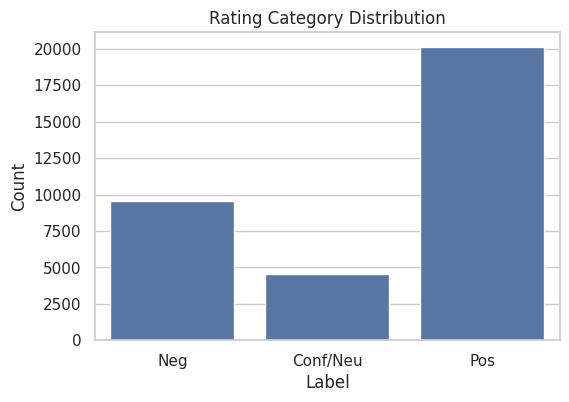

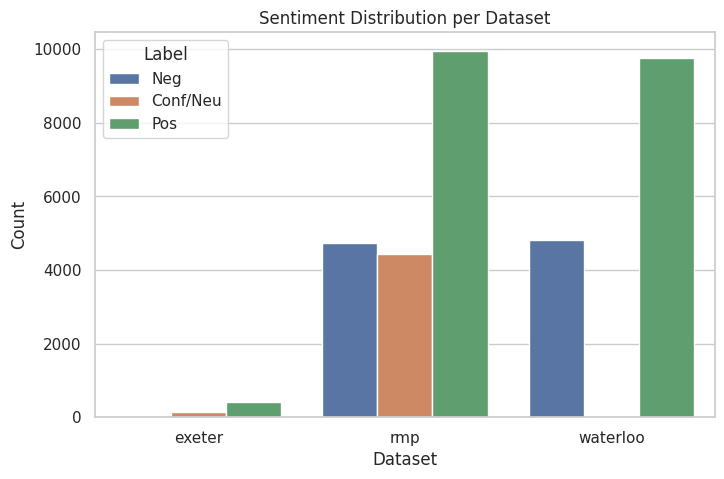

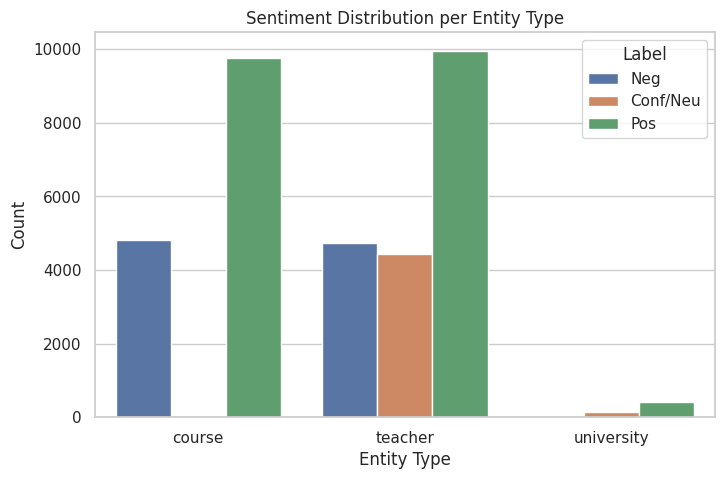

In [ ]:
# Label distribution
plt.figure(figsize=(6,4))
sns.countplot(data=df, x="rating_cat", order=["Neg","Conf/Neu","Pos"])
plt.title("Rating Category Distribution")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()

# Dataset × label
plt.figure(figsize=(8,5))
sns.countplot(data=df, x="dataset", hue="rating_cat",
              hue_order=["Neg","Conf/Neu","Pos"])
plt.title("Sentiment Distribution per Dataset")
plt.xlabel("Dataset")
plt.ylabel("Count")
plt.legend(title="Label")
plt.show()

# Entity type × label
plt.figure(figsize=(8,5))
sns.countplot(data=df, x="entity_type", hue="rating_cat",
              hue_order=["Neg","Conf/Neu","Pos"])
plt.title("Sentiment Distribution per Entity Type")
plt.xlabel("Entity Type")
plt.ylabel("Count")
plt.legend(title="Label")
plt.show()


## 2. Text length (overall + by label / dataset)

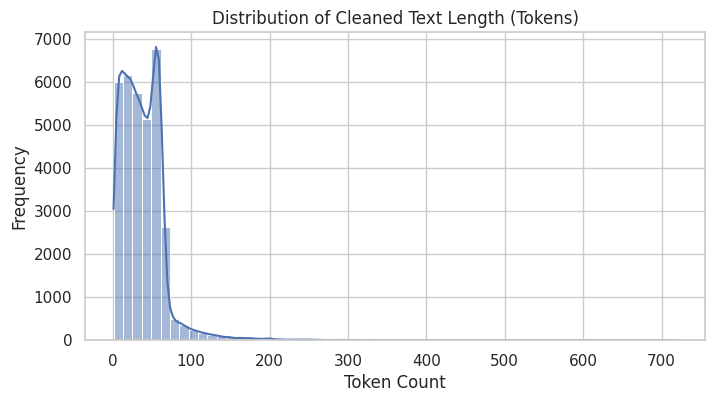

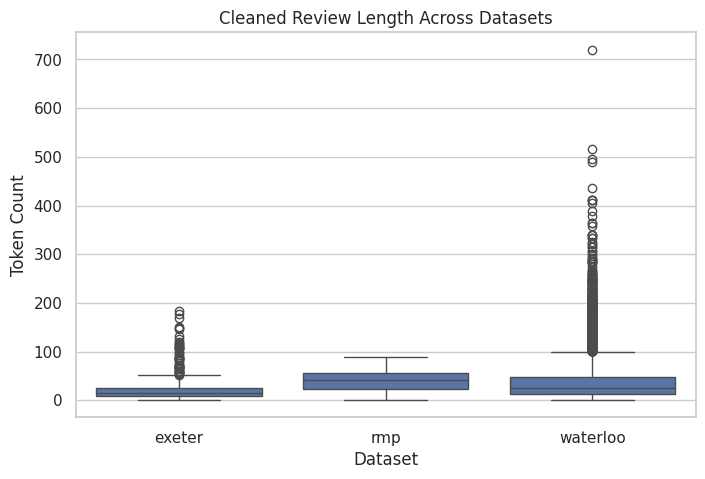

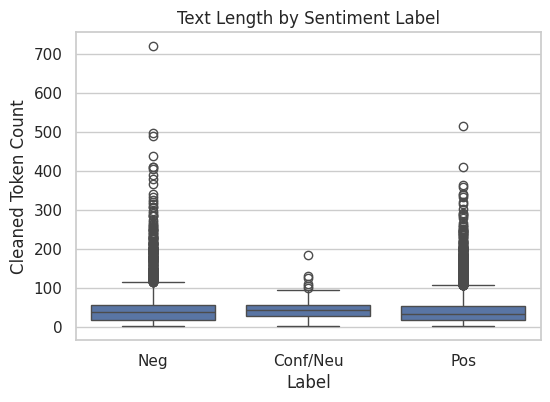

In [ ]:
# Histogram of cleaned length
plt.figure(figsize=(8,4))
sns.histplot(df["clean_len"], bins=60, kde=True)
plt.title("Distribution of Cleaned Text Length (Tokens)")
plt.xlabel("Token Count")
plt.ylabel("Frequency")
plt.show()

# Boxplot by dataset
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x="dataset", y="clean_len")
plt.title("Cleaned Review Length Across Datasets")
plt.xlabel("Dataset")
plt.ylabel("Token Count")
plt.show()

# Boxplot by label
plt.figure(figsize=(6,4))
sns.boxplot(data=df, x="rating_cat", y="clean_len",
            order=["Neg","Conf/Neu","Pos"])
plt.title("Text Length by Sentiment Label")
plt.xlabel("Label")
plt.ylabel("Cleaned Token Count")
plt.show()


## 3. Correlation heatmap of numeric features

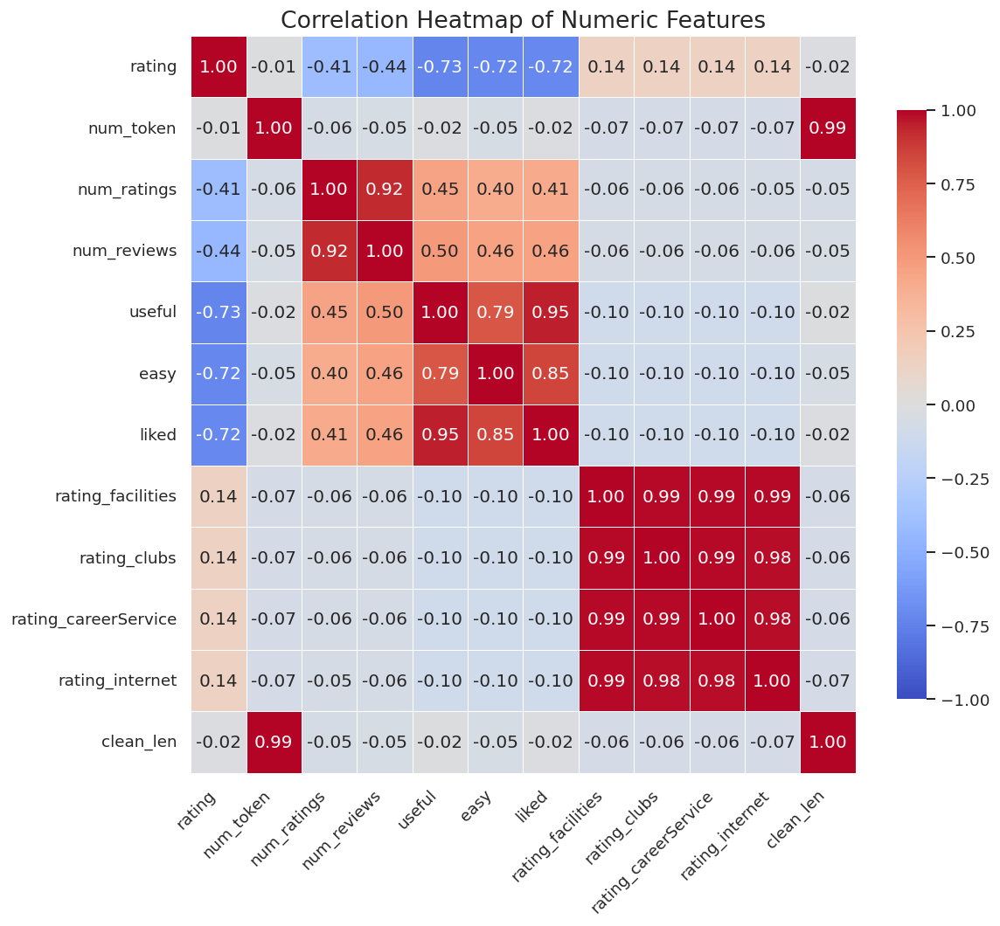

In [ ]:
num_cols = [
    "rating","num_token","num_ratings","num_reviews",
    "useful","easy","liked",
    "rating_facilities","rating_clubs","rating_careerService",
    "rating_internet","clean_len"
]

corr = df[num_cols].corr()

plt.figure(figsize=(10,9), dpi=120)
sns.heatmap(
    corr, annot=True, fmt=".2f",
    cmap="coolwarm", vmin=-1, vmax=1,
    linewidths=0.5, cbar_kws={'shrink':0.8}
)
plt.title("Correlation Heatmap of Numeric Features", fontsize=16)
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


## 4. WordClouds (global + by label + by entity)

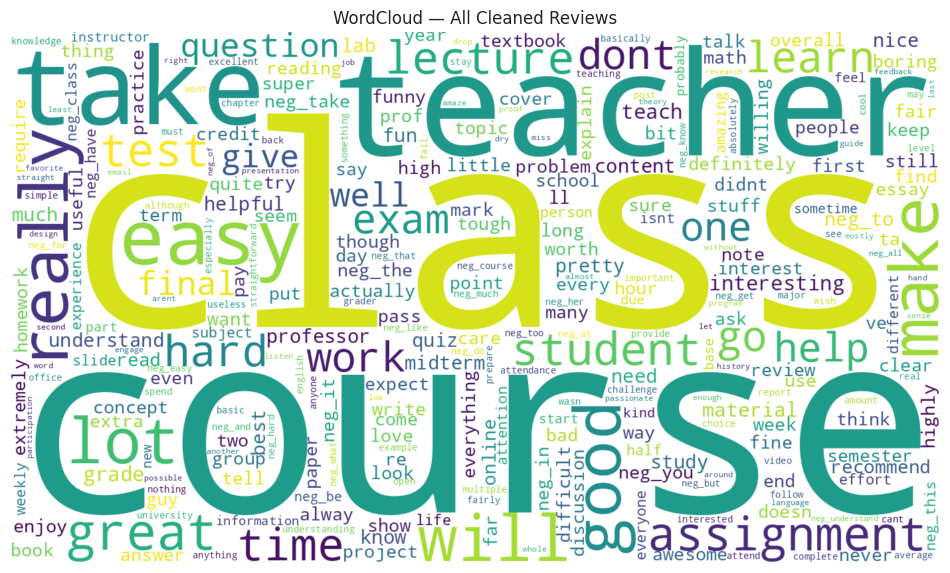

In [ ]:
# Global WC
all_text = " ".join(df["text_clean"].tolist())
wc = WordCloud(width=1400, height=800,
               background_color="white",
               max_words=300, collocations=False).generate(all_text)

plt.figure(figsize=(12,8))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud — All Cleaned Reviews")
plt.show()


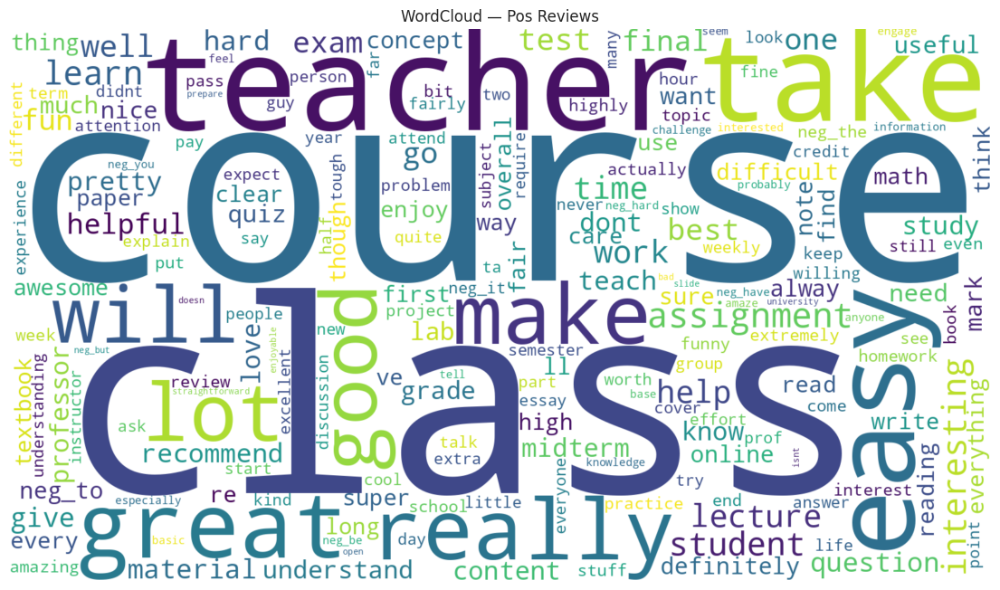

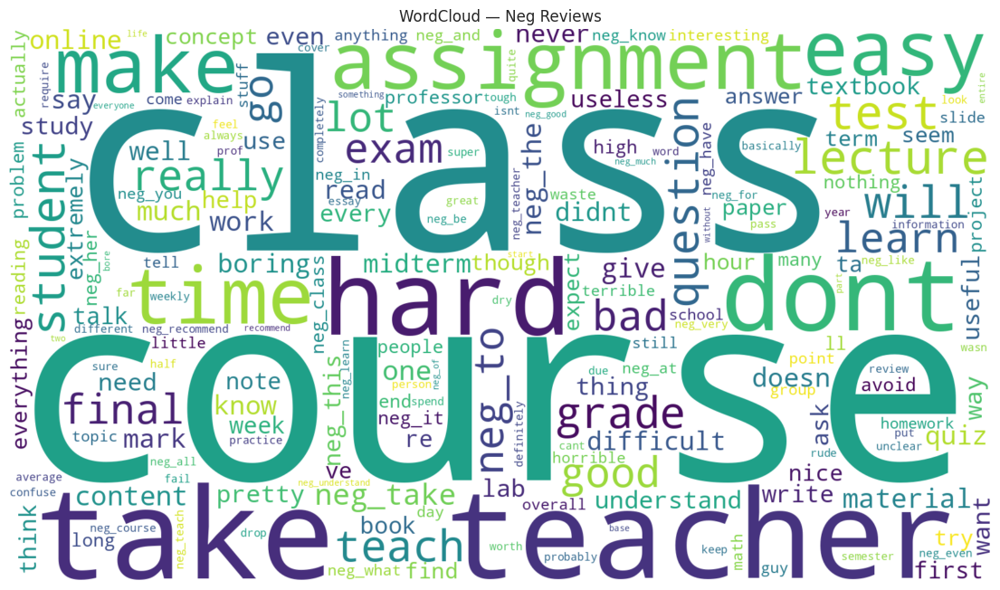

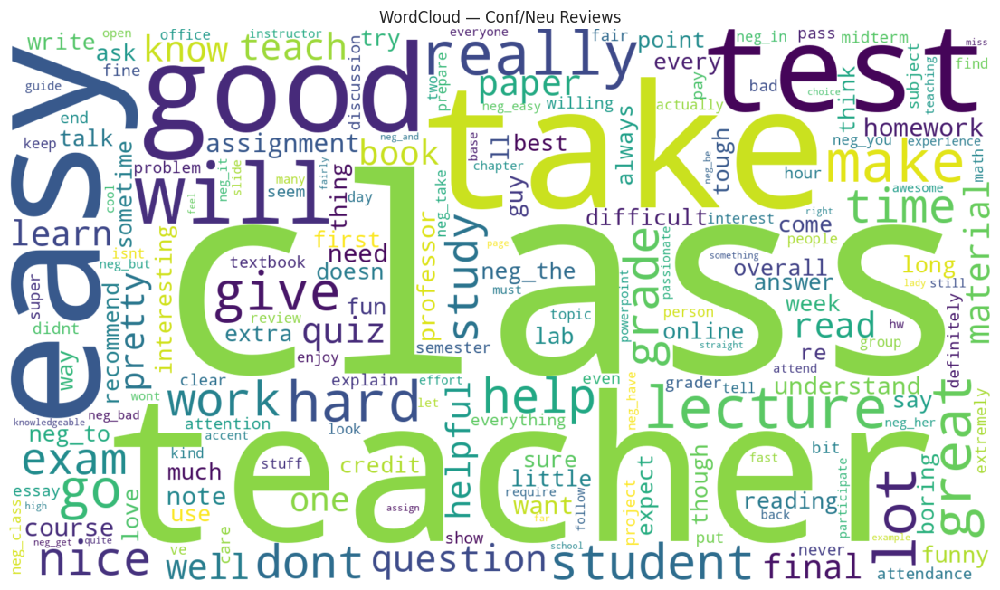

In [ ]:
# Label-wise WC
for lab in ["Pos", "Neg", "Conf/Neu"]:
    subset_text = " ".join(df[df["rating_cat"] == lab]["text_clean"])
    wc = WordCloud(width=1600, height=900,
                   background_color="white",
                   max_words=200, collocations=False).generate(subset_text)
    plt.figure(figsize=(14,8))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"WordCloud — {lab} Reviews")
    plt.show()


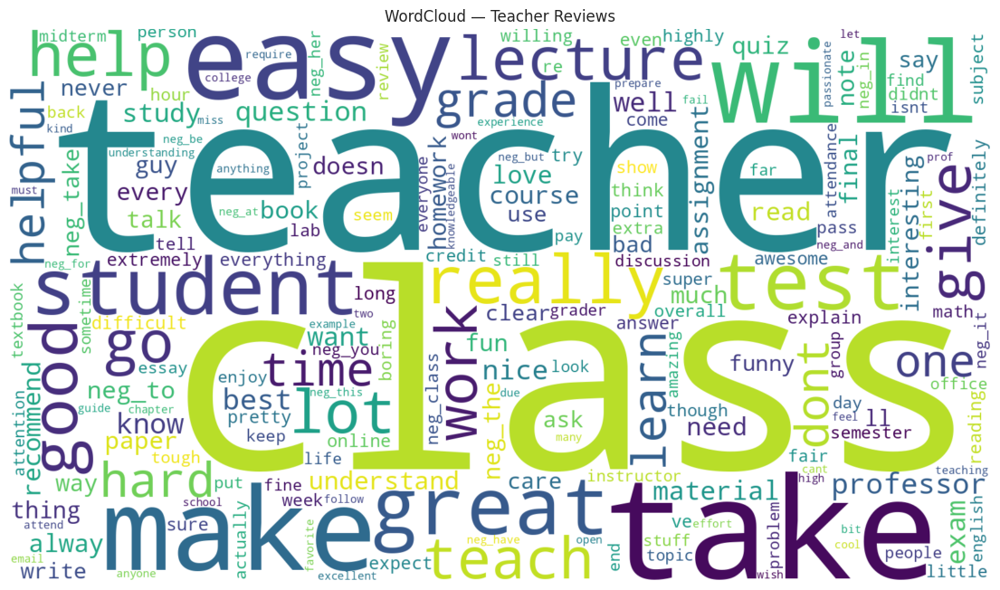

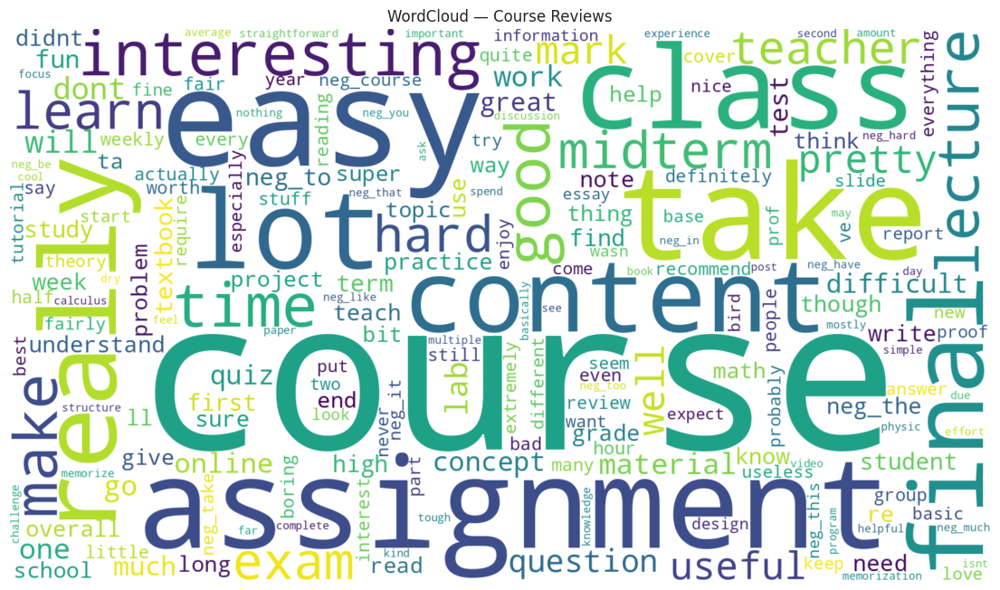

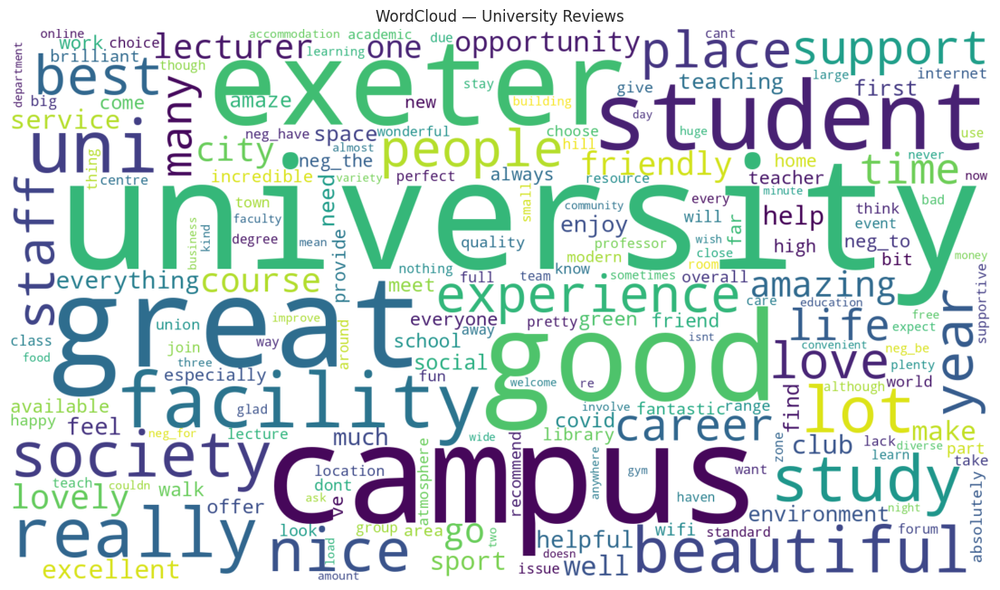

In [ ]:
# Entity-wise WC
for ent in ["teacher", "course", "university"]:
    subset_text = " ".join(df[df["entity_type"] == ent]["text_clean"])
    wc = WordCloud(width=1600, height=900,
                   background_color="white",
                   max_words=200, collocations=False).generate(subset_text)
    plt.figure(figsize=(14,8))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"WordCloud — {ent.capitalize()} Reviews")
    plt.show()


## 5. N-grams (bigrams/trigrams) — helper + plots

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

def get_top_ngrams(texts, ngram_range=(2,2), top_n=20, min_df=5):
    vec = CountVectorizer(ngram_range=ngram_range, min_df=min_df)
    X = vec.fit_transform(texts)
    counts = X.sum(axis=0).A1
    vocab = vec.get_feature_names_out()
    df_ng = pd.DataFrame({"ngram": vocab, "count": counts})
    return df_ng.sort_values("count", ascending=False).head(top_n)

def plot_ngrams(df_ng, title):
    plt.figure(figsize=(10,6))
    sns.barplot(data=df_ng, x="count", y="ngram", color="#F0D98C")
    plt.title(title)
    plt.xlabel("Frequency")
    plt.ylabel("N-gram")
    plt.tight_layout()
    plt.show()


###Label-wise bigrams & trigrams

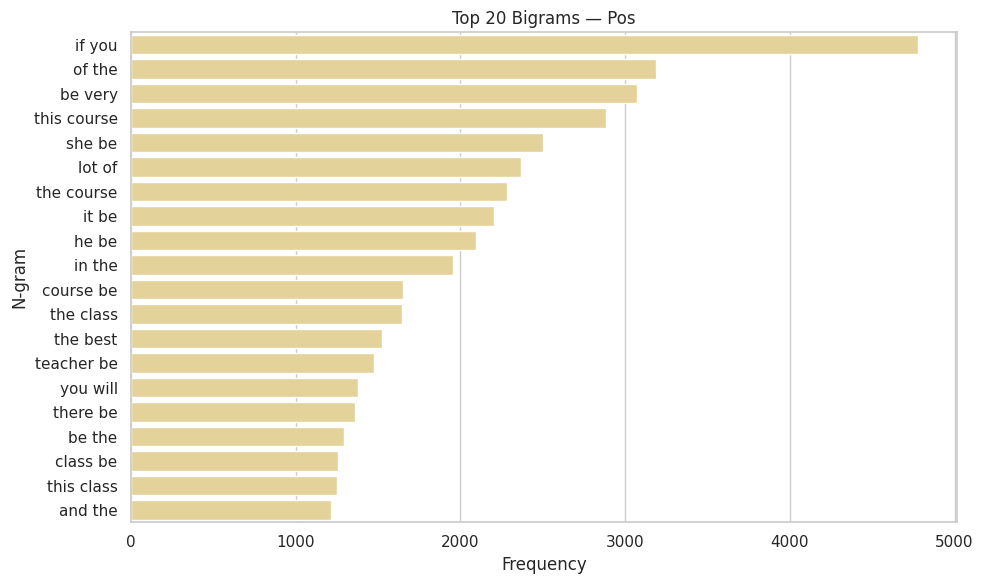

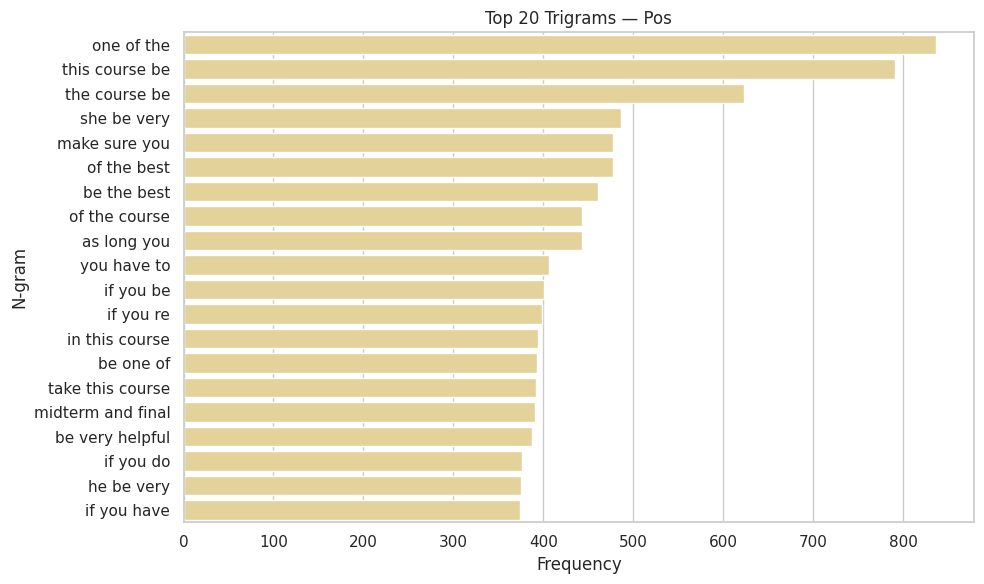

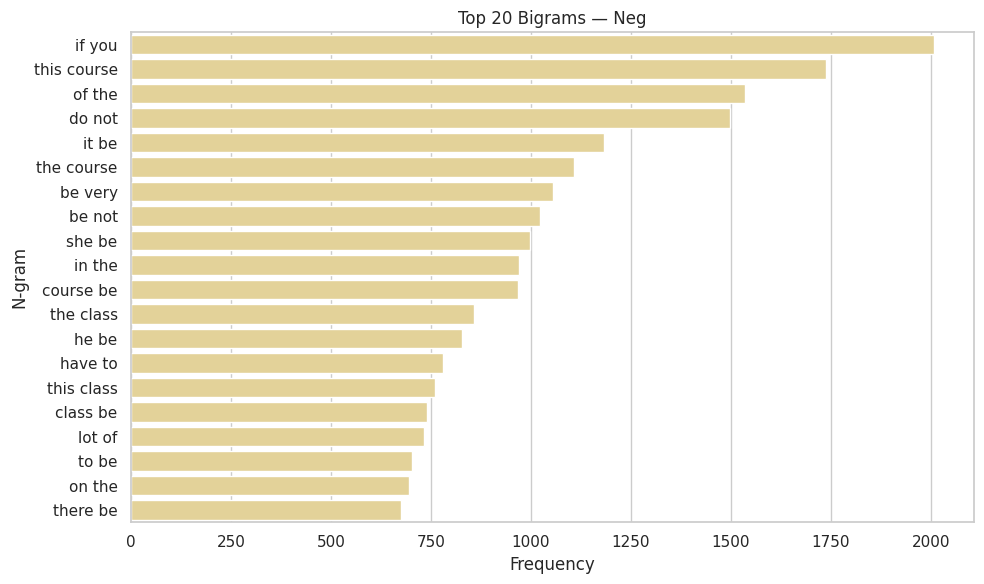

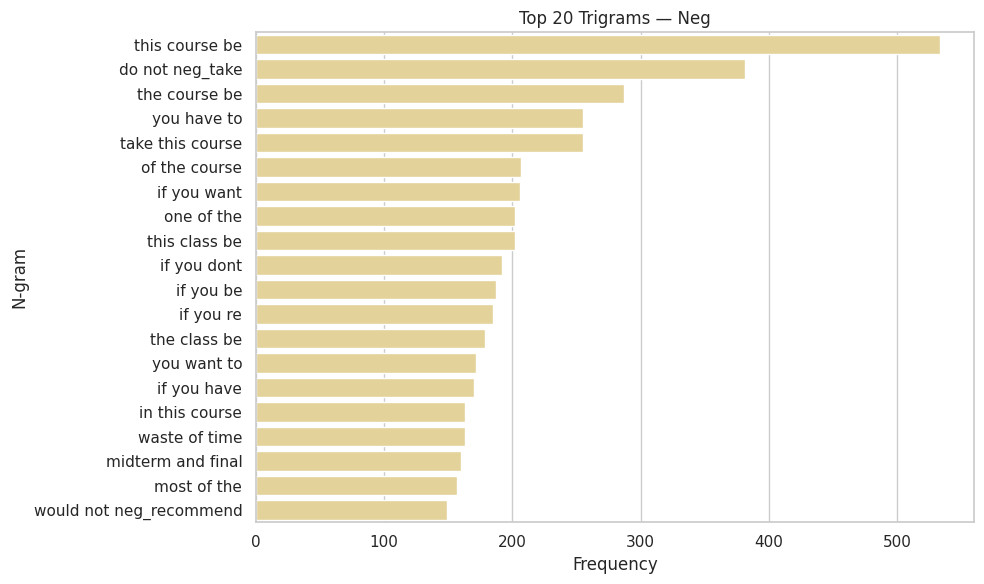

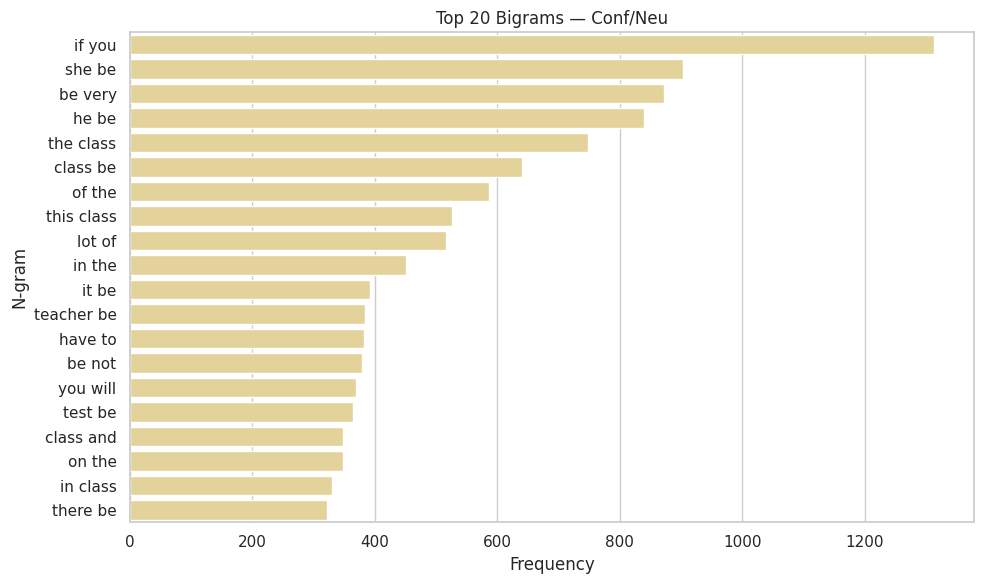

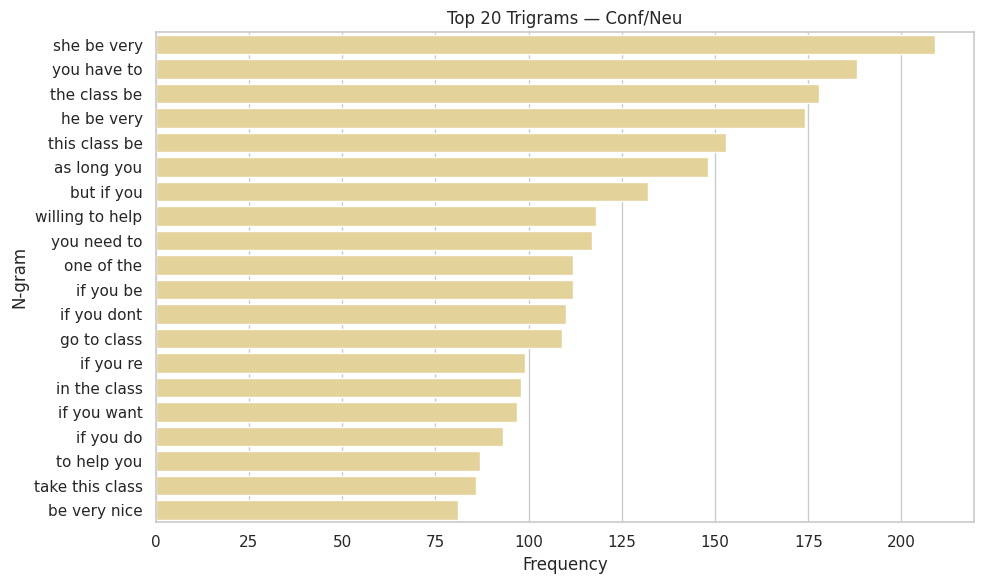

In [ ]:
for lab in ["Pos", "Neg", "Conf/Neu"]:
    sub = df[df["rating_cat"] == lab]["text_clean"]
    bi = get_top_ngrams(sub, (2,2), 20)
    tri = get_top_ngrams(sub, (3,3), 20)

    plot_ngrams(bi,  f"Top 20 Bigrams — {lab}")
    plot_ngrams(tri, f"Top 20 Trigrams — {lab}")


## 6 Lexical richness & complexity

In [ ]:
def lexical_stats(group_df):
    tokens = group_df["text_clean"].str.split()
    n_tokens = tokens.apply(len).sum()
    vocab = set(w for row in tokens for w in row)
    n_types = len(vocab)
    ttr = n_types / n_tokens if n_tokens > 0 else 0
    return pd.Series({
        "n_docs": len(group_df),
        "tokens": n_tokens,
        "types": n_types,
        "TTR": ttr,
        "avg_len": group_df["clean_len"].mean()
    })


In [ ]:
# By label
lex_by_label = df.groupby("rating_cat").apply(lexical_stats)
print("\nLexical stats by label:")
display(lex_by_label)

# By dataset
lex_by_dataset = df.groupby("dataset").apply(lexical_stats)
print("\nLexical stats by dataset:")
display(lex_by_dataset)



Lexical stats by label:


/tmp/ipython-input-2826794812.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  lex_by_label = df.groupby("rating_cat").apply(lexical_stats)


,n_docs,tokens,types,TTR,avg_len
rating_cat,,,,,
Conf/Neu,4571.0,186934.0,7060.0,0.037767,40.895646
Neg,9557.0,386747.0,11313.0,0.029252,40.467406
Pos,20139.0,728577.0,14643.0,0.020098,36.177417


/tmp/ipython-input-2826794812.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  lex_by_dataset = df.groupby("dataset").apply(lexical_stats)



Lexical stats by dataset:


/tmp/ipython-input-2826794812.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  lex_by_dataset = df.groupby("dataset").apply(lexical_stats)


,n_docs,tokens,types,TTR,avg_len
dataset,,,,,
exeter,557.0,13193.0,1743.0,0.132116,23.685817
rmp,19135.0,746445.0,14686.0,0.019675,39.009407
waterloo,14575.0,542620.0,11914.0,0.021956,37.229503


##7. POS tag distribution (per label)

         Pos      Neg  Conf/Neu
CC    3576.0   3286.0    4088.0
CD     325.0    249.0     272.0
DT    4794.0   5327.0    4699.0
EX      76.0     72.0      72.0
FW      21.0     34.0      61.0
IN    7152.0   7871.0    7854.0
JJ    9290.0   9658.0    9959.0
JJR    178.0    155.0     154.0
JJS    311.0    176.0     248.0
MD     994.0    901.0    1194.0
NN   16148.0  17187.0   17349.0
NNP      0.0      3.0       6.0
NNS    461.0    590.0     518.0
PDT     79.0     92.0      85.0
PRP   5039.0   5109.0    6788.0


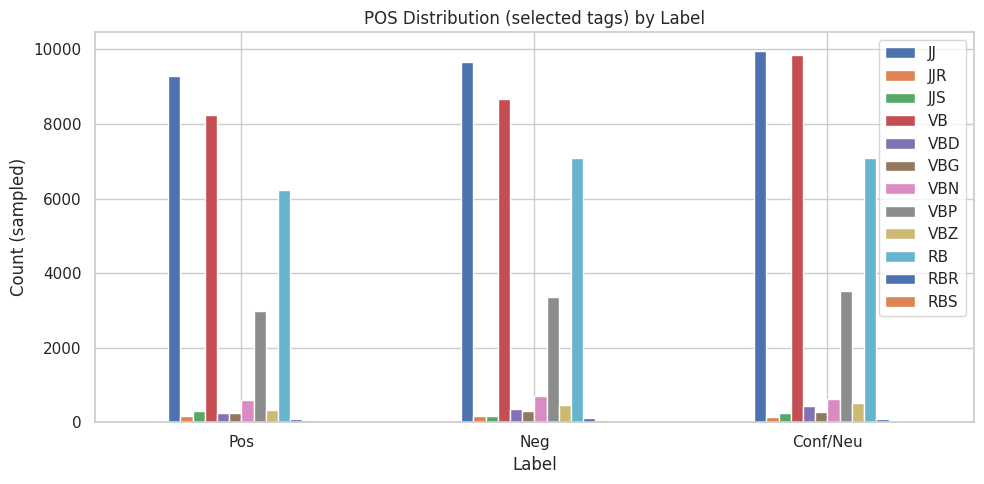

In [ ]:
def get_pos_counts(text, max_tokens=100):
    tokens = word_tokenize(text)[:max_tokens]
    tags = [tag for _, tag in pos_tag(tokens)]
    return pd.Series(tags).value_counts()

def pos_distribution(df_subset, sample_size=2000):
    # sample to keep it fast
    sample = df_subset.sample(min(len(df_subset), sample_size), random_state=42)
    pos_counts = sample["text_clean"].apply(get_pos_counts).fillna(0)
    return pos_counts.sum().sort_values(ascending=False)
pos_by_label = {}
for lab in ["Pos", "Neg", "Conf/Neu"]:
    pos_by_label[lab] = pos_distribution(df[df["rating_cat"] == lab])

pos_df = pd.DataFrame(pos_by_label).fillna(0)
print(pos_df.head(15))  # top POS tags
# Visualise a few key tags (e.g., adjectives JJ, verbs VB/VBD/VBZ, adverbs RB)
key_tags = ["JJ","JJR","JJS","VB","VBD","VBG","VBN","VBP","VBZ","RB","RBR","RBS"]
subset = pos_df.loc[key_tags].T  # rows=labels, cols=tags

subset.plot(kind="bar", figsize=(10,5))
plt.title("POS Distribution (selected tags) by Label")
plt.xlabel("Label")
plt.ylabel("Count (sampled)")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


## 8. Embedding-based visualisation (TF-IDF + SVD + t-SNE)

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


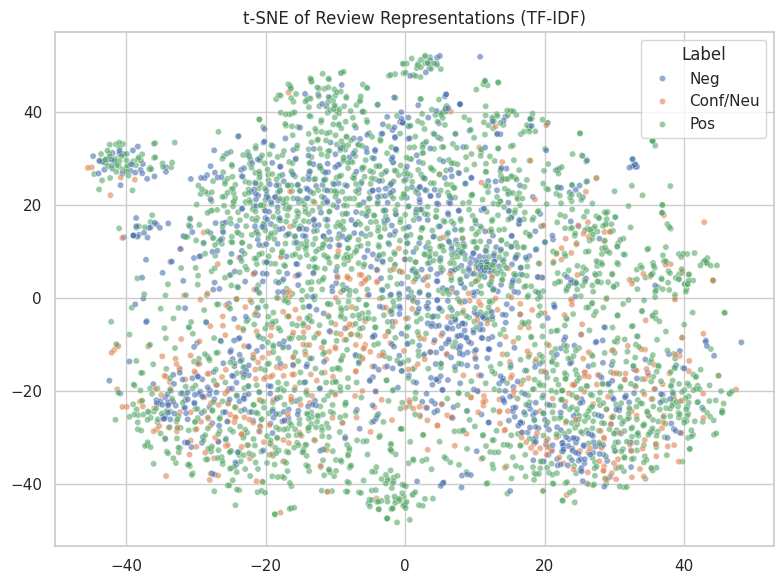

In [ ]:
sample = df.sample(4000, random_state=42)
texts = sample["text_clean"].tolist()
labels = sample["rating_cat"].tolist()

tfidf = TfidfVectorizer(max_features=5000, min_df=5)
X = tfidf.fit_transform(texts)

svd = TruncatedSVD(n_components=50, random_state=42)
X_reduced = svd.fit_transform(X)

tsne = TSNE(n_components=2, perplexity=40, random_state=42, n_iter=2000)
X_tsne = tsne.fit_transform(X_reduced)

sample["tsne_x"] = X_tsne[:,0]
sample["tsne_y"] = X_tsne[:,1]

plt.figure(figsize=(8,6))
sns.scatterplot(data=sample, x="tsne_x", y="tsne_y",
                hue="rating_cat", hue_order=["Neg","Conf/Neu","Pos"],
                alpha=0.6, s=20)
plt.title("t-SNE of Review Representations (TF-IDF)")
plt.xlabel("")
plt.ylabel("")
plt.legend(title="Label")
plt.tight_layout()
plt.show()


## 9. Outlier check (very long reviews)

In [ ]:
q99 = df["clean_len"].quantile(0.99)
print("99th percentile of clean_len:", q99)

outliers = df[df["clean_len"] > q99]
print("Number of outlier reviews:", len(outliers))

# Quick peek
display(outliers[["dataset","entity_type","rating_cat","clean_len","review_text"]].head())


99th percentile of clean_len: 146.0
Number of outlier reviews: 330


,dataset,entity_type,rating_cat,clean_len,review_text
19141,waterloo,course,Pos,156,"I really enjoyed this course online, being co-..."
19142,waterloo,course,Neg,168,math student who took this course since I had ...
19147,waterloo,course,Pos,176,I took this course online due to the COVID-19 ...
19152,waterloo,course,Pos,147,Nice course that teaches you how to write simp...
19250,waterloo,course,Neg,489,In the beginning of the term this course felt ...


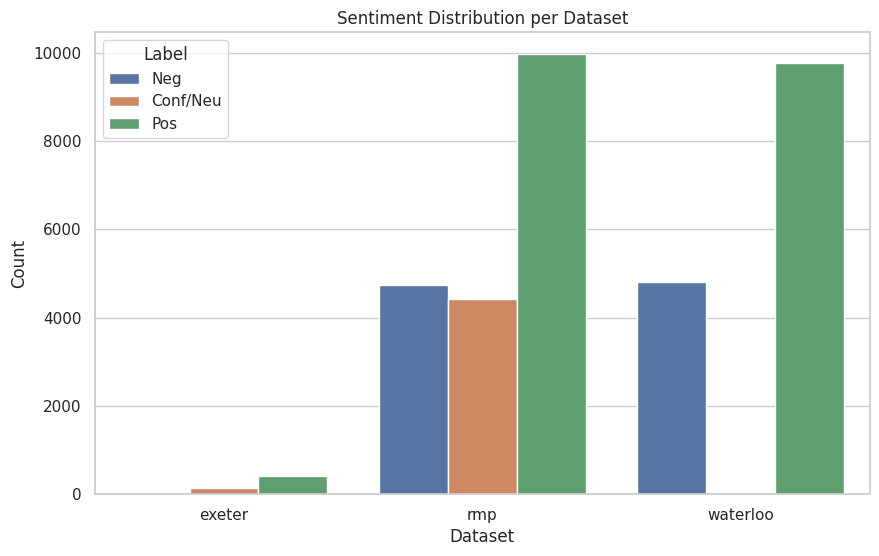

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=final_cleaned_unified, x="dataset", hue="rating_cat")
plt.title("Sentiment Distribution per Dataset")
plt.xlabel("Dataset")
plt.ylabel("Count")
plt.legend(title="Label")
plt.show()


## 10. Topic Modelling using LDA (BoW)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from nltk.corpus import stopwords
import nltk
nltk.download("stopwords")

# Stopwords
stop_words = set(stopwords.words("english"))

# Add domain-specific stopwords
domain_stopwords = {
    "class", "course", "teacher", "professor", "lecture",
    "exam", "assignment", "student", "work", "quiz",
    "midterm", "final", "mark", "grade"
}

stop_words = stop_words.union(domain_stopwords)

# Convert set → list for CountVectorizer
stop_words = list(stop_words)

# Vectorizer
vectorizer = CountVectorizer(
    max_df=0.90,
    min_df=50,
    stop_words=stop_words
)

X = vectorizer.fit_transform(final_cleaned_unified["text_clean"])

# LDA Model
lda = LatentDirichletAllocation(
    n_components=6,
    learning_method="batch",
    random_state=42
)
lda.fit(X)

# Display topics
terms = vectorizer.get_feature_names_out()

for idx, topic in enumerate(lda.components_):
    print(f"\n TOPIC {idx+1}")
    print([terms[i] for i in topic.argsort()[-15:]])


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.



 TOPIC 1
['read', 'neg_at', 'would', 'neg_in', 'neg_have', 'neg_class', 'neg_this', 'neg_it', 'never', 'didnt', 'take', 'neg_take', 'neg_the', 'neg_to', 'dont']

 TOPIC 2
['learn', 'hard', 'thing', 'would', 'think', 'question', 'take', 'say', 'time', 'bad', 'make', 'know', 'get', 'teach', 'like']

 TOPIC 3
['make', 'homework', 'question', 'note', 'help', 'really', 'nice', 'go', 'study', 'hard', 'get', 'give', 'good', 'easy', 'test']

 TOPIC 4
['easy', 'would', 'lot', 'one', 'fun', 'helpful', 'help', 'learn', 'recommend', 'love', 'really', 'best', 'make', 'great', 'take']

 TOPIC 5
['first', 'good', 'hard', 'pretty', 'difficult', 'really', 'learn', 'concept', 'time', 'take', 'lot', 'content', 'interesting', 'easy', 'useful']

 TOPIC 6
['write', 'reading', 'make', 'textbook', 'well', 'content', 'pretty', 'week', 'question', 'lot', 'get', 'online', 'take', 'lab', 'easy']


## 11. Keyword Importance per Emotion (Chi-Square)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import chi2
vec = CountVectorizer(min_df=20)
X = vec.fit_transform(final_cleaned_unified["text_clean"])
y = final_cleaned_unified["rating_cat"]

chi2_scores, p = chi2(X, y)
scores = pd.DataFrame({"term": vec.get_feature_names_out(), "score": chi2_scores})
top_scores = scores.sort_values("score", ascending=False)

print(top_scores.head(30))


               term        score
1624            not  1957.994500
425          course  1720.884214
877              he  1410.555030
839           great  1382.629773
1533       neg_take  1330.934684
165             bad  1316.554549
318           class  1051.777509
2045            she   916.714365
2366        useless   900.774858
196            best   825.937918
155           avoid   777.053529
790             fun   709.069111
549           doesn   708.303972
999     interesting   680.961492
230          boring   642.975215
918        horrible   635.789641
1555       neg_this   624.869817
2227       terrible   567.049113
889         helpful   540.731542
1492  neg_recommend   540.149370
2402          waste   530.864789
2259           this   503.426404
1127           love   476.566492
1987           rude   472.912252
1615             no   465.124737
1383        neg_her   449.234893
551            dont   438.167110
2229           test   433.962486
1611           nice   429.079322
159       

## 12. Emotion Trend by Review Length

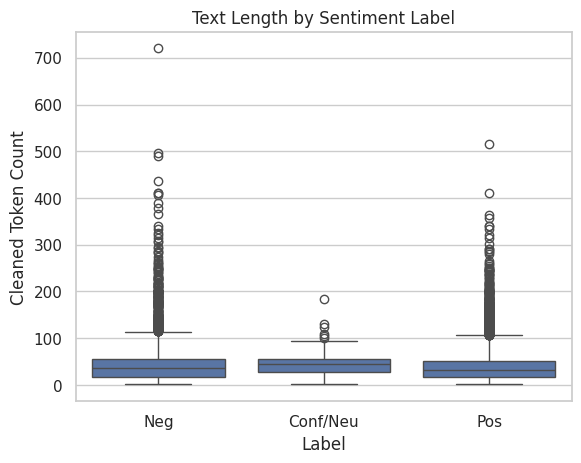

In [ ]:
sns.boxplot(data=final_cleaned_unified, x="rating_cat", y="clean_len")
plt.title("Text Length by Sentiment Label")
plt.xlabel("Label")
plt.ylabel("Cleaned Token Count")
plt.show()

# **Data Preprocessing**

## Feature engineering on final_cleaned_unified → df_fe

In [ ]:
df_fe = final_cleaned_unified.copy().reset_index(drop=True)

label_order = ["Neg", "Conf/Neu", "Pos"]
label2id = {lab: i for i, lab in enumerate(label_order)}
id2label = {i: lab for lab, i in label2id.items()}

df_fe = df_fe[df_fe["rating_cat"].isin(label_order)].reset_index(drop=True)
df_fe["label_id"] = df_fe["rating_cat"].map(label2id).astype(int)

df_fe["clean_len"] = df_fe["text_clean"].str.split().str.len()

def neg_ratio(text):
    toks = str(text).split()
    if not toks:
        return 0.0
    return sum(1 for t in toks if t.startswith("neg_")) / len(toks)

df_fe["neg_ratio"] = df_fe["text_clean"].apply(neg_ratio)
df_fe["exclam_count"] = df_fe["review_text_pre"].str.count("!")
df_fe["quest_count"]  = df_fe["review_text_pre"].str.count(r"\?")

df_fe = pd.get_dummies(
    df_fe,
    columns=["dataset", "entity_type"],
    drop_first=True
)

extra_feat_cols = [
    "clean_len",
    "neg_ratio",
    "exclam_count",
    "quest_count",
    "dataset_rmp",
    "dataset_waterloo",
    "entity_type_teacher",
    "entity_type_university",
]
extra_feat_cols = [c for c in extra_feat_cols if c in df_fe.columns]

print("Feature-engineering base shape:", df_fe.shape)
print("Extra numeric features:", extra_feat_cols)
print("Label mapping:", label2id)
print(df_fe["rating_cat"].value_counts())
df_fe[extra_feat_cols].describe()

Feature-engineering base shape: (34267, 36)
Extra numeric features: ['clean_len', 'neg_ratio', 'exclam_count', 'quest_count', 'dataset_rmp', 'dataset_waterloo', 'entity_type_teacher', 'entity_type_university']
Label mapping: {'Neg': 0, 'Conf/Neu': 1, 'Pos': 2}
rating_cat
Pos         20139
Neg          9557
Conf/Neu     4571
Name: count, dtype: int64


,clean_len,neg_ratio,exclam_count,quest_count
count,34267.000000,34267.000000,34267.000000,34267.000000
mean,38.003268,0.044140,0.325999,0.018969
std,29.283840,0.074920,0.724118,0.176517
min,1.000000,0.000000,0.000000,0.000000
25%,18.000000,0.000000,0.000000,0.000000
50%,35.000000,0.000000,0.000000,0.000000
75%,54.000000,0.068571,0.000000,0.000000
max,720.000000,0.750000,11.000000,9.000000


## Stratified train/val/test split (70/15/15) + class weights from train

In [ ]:
y_all = df_fe["label_id"].values
indices = np.arange(len(df_fe))

train_idx, temp_idx, y_train, y_temp = train_test_split(
    indices,
    y_all,
    test_size=0.30,
    stratify=y_all,
    random_state=RANDOM_SEED,
)

val_idx, test_idx, y_val, y_test = train_test_split(
    temp_idx,
    y_temp,
    test_size=0.50,
    stratify=y_temp,
    random_state=RANDOM_SEED,
)

print("Train size:", len(train_idx))
print("Val size  :", len(val_idx))
print("Test size :", len(test_idx))

classes = np.unique(y_train)
weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train,
)
class_weight_dict = {int(c): float(w) for c, w in zip(classes, weights)}

print("Class weights (train only):", class_weight_dict)
print("id2label:", id2label)


Train size: 23986
Val size  : 5140
Test size : 5141
Class weights (train only): {0: 1.1951170901843549, 1: 2.499322705011983, 2: 0.5671655907876381}
id2label: {0: 'Neg', 1: 'Conf/Neu', 2: 'Pos'}


## TF-IDF

In [ ]:
X_train_text = df_fe.loc[train_idx, "text_clean"].astype(str)
X_val_text   = df_fe.loc[val_idx,   "text_clean"].astype(str)
X_test_text  = df_fe.loc[test_idx,  "text_clean"].astype(str)

tfidf_vectorizer = TfidfVectorizer(
    max_features=40000,
    ngram_range=(1, 2),
    min_df=5,
    max_df=0.9,
)

X_train_tfidf = tfidf_vectorizer.fit_transform(X_train_text)
X_val_tfidf   = tfidf_vectorizer.transform(X_val_text)
X_test_tfidf  = tfidf_vectorizer.transform(X_test_text)

print("TF-IDF shapes:")
print("  Train:", X_train_tfidf.shape)
print("  Val  :", X_val_tfidf.shape)
print("  Test :", X_test_tfidf.shape)


TF-IDF shapes:
  Train: (23986, 27244)
  Val  : (5140, 27244)
  Test : (5141, 27244)


## Scale numeric features (train only) + combine with TF-IDF

In [ ]:
X_meta_train = df_fe.loc[train_idx, extra_feat_cols].astype(float).values
X_meta_val   = df_fe.loc[val_idx,   extra_feat_cols].astype(float).values
X_meta_test  = df_fe.loc[test_idx,  extra_feat_cols].astype(float).values

X_meta_train = np.nan_to_num(X_meta_train, nan=0.0)
X_meta_val   = np.nan_to_num(X_meta_val,   nan=0.0)
X_meta_test  = np.nan_to_num(X_meta_test,  nan=0.0)

scaler = StandardScaler()
X_meta_train_scaled = scaler.fit_transform(X_meta_train)
X_meta_val_scaled   = scaler.transform(X_meta_val)
X_meta_test_scaled  = scaler.transform(X_meta_test)

X_meta_train_sp = csr_matrix(X_meta_train_scaled)
X_meta_val_sp   = csr_matrix(X_meta_val_scaled)
X_meta_test_sp  = csr_matrix(X_meta_test_scaled)

X_train_combined = hstack([X_train_tfidf, X_meta_train_sp])
X_val_combined   = hstack([X_val_tfidf,   X_meta_val_sp])
X_test_combined  = hstack([X_test_tfidf,  X_meta_test_sp])

print("Combined feature shapes:")
print("  Train:", X_train_combined.shape)
print("  Val  :", X_val_combined.shape)
print("  Test :", X_test_combined.shape)


Combined feature shapes:
  Train: (23986, 27252)
  Val  : (5140, 27252)
  Test : (5141, 27252)


#**Baseline Models**

##LOGISTIC REGRESSION

Fitting 5 folds for each of 3 candidates, totalling 15 fits

Best Hyperparameters: {'C': 2.0}

=== Logistic Regression (Validation) ===
              precision    recall  f1-score   support

         Neg       0.71      0.74      0.72      1433
    Conf/Neu       0.41      0.65      0.50       686
         Pos       0.85      0.72      0.78      3021

    accuracy                           0.72      5140
   macro avg       0.66      0.70      0.67      5140
weighted avg       0.75      0.72      0.73      5140


=== Logistic Regression (Test) ===
              precision    recall  f1-score   support

         Neg       0.72      0.74      0.73      1434
    Conf/Neu       0.39      0.66      0.49       686
         Pos       0.86      0.72      0.78      3021

    accuracy                           0.72      5141
   macro avg       0.66      0.71      0.67      5141
weighted avg       0.76      0.72      0.73      5141


Confusion Matrix (Test):
[[1060  173  201]
 [  84  455  147]
 [ 3

<Figure size 600x500 with 0 Axes>

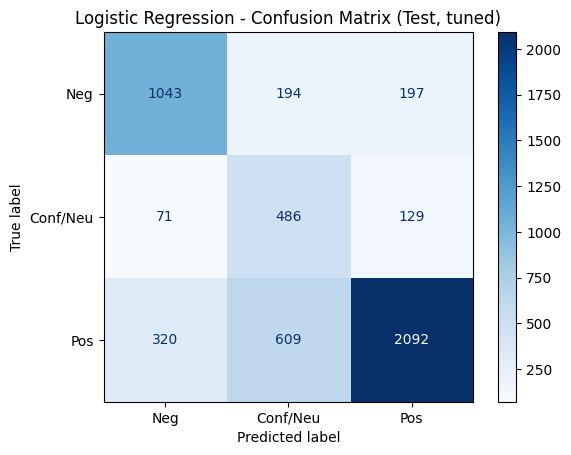

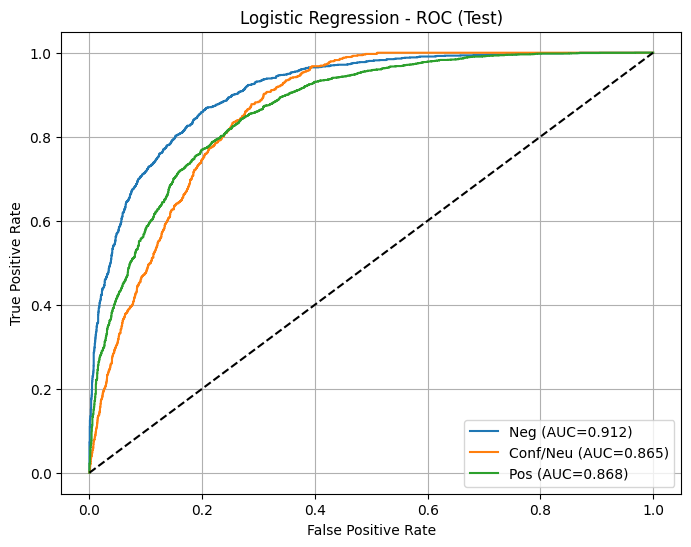


Macro ROC-AUC (Test): 0.8816833864258063


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)

labels = ["Neg", "Conf/Neu", "Pos"]

# 1) GridSearchCV on Logistic Regression
param_grid = {"C": [0.5, 1.0, 2.0]}

log_reg = LogisticRegression(
    max_iter=2000,
    class_weight="balanced",
    n_jobs=-1,
    solver="lbfgs"
)

grid = GridSearchCV(
    estimator=log_reg,
    param_grid=param_grid,
    scoring="f1_macro",
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train_combined, y_train)
best_lr = grid.best_estimator_

print("\nBest Hyperparameters:", grid.best_params_)

# 2) Validation performance
y_val_pred = best_lr.predict(X_val_combined)
print("\n=== Logistic Regression (Validation) ===")
print(classification_report(y_val, y_val_pred, target_names=labels))

# 3) Test performance
y_test_pred = best_lr.predict(X_test_combined)
print("\n=== Logistic Regression (Test) ===")
print(classification_report(y_test, y_test_pred, target_names=labels))

print("\nConfusion Matrix (Test):")
cm_test = confusion_matrix(y_test, y_test_pred)
print(cm_test)

# 4) THRESHOLD TUNING for Conf/Neu (post-hoc)
val_probs = best_lr.predict_proba(X_val_combined)
test_probs = best_lr.predict_proba(X_test_combined)

def predict_with_alpha_probs(probs, alpha_conf):
    """Boost Conf/Neu probability by alpha_conf and renormalise."""
    p = probs.copy()
    p[:, 1] = p[:, 1] * alpha_conf
    p = p / p.sum(axis=1, keepdims=True)
    return np.argmax(p, axis=1)

alphas = [1.0, 1.2, 1.4, 1.6, 2.0]
best_macro, best_alpha = -1, 1.0

for a in alphas:
    y_val_adj = predict_with_alpha_probs(val_probs, a)
    y_val_onehot_pred = np.eye(3)[y_val_adj]
    macro = roc_auc_score(y_val, y_val_onehot_pred, multi_class="ovr", average="macro")
    print(f"alpha={a:.1f} → macro score (approx): {macro:.4f}")
    if macro > best_macro:
        best_macro = macro
        best_alpha = a

print("\nBest alpha:", best_alpha, " | Best macro (approx):", best_macro)

y_val_final = predict_with_alpha_probs(val_probs, best_alpha)
y_test_final = predict_with_alpha_probs(test_probs, best_alpha)

print("\n=== Logistic Regression (Validation, tuned threshold) ===")
print(classification_report(y_val, y_val_final, target_names=labels))

print("\n=== Logistic Regression (Test, tuned threshold) ===")
print(classification_report(y_test, y_test_final, target_names=labels))

# 5) Plot Confusion Matrix (Test, tuned)
plt.figure(figsize=(6, 5))
disp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_test_final), display_labels=labels)
disp.plot(cmap="Blues", values_format="d")
plt.title("Logistic Regression - Confusion Matrix (Test, tuned)")
plt.show()

# 6) ROC curves (multiclass, one-vs-rest, untuned probs)
y_test_bin = np.eye(3)[y_test]
y_test_prob = best_lr.predict_proba(X_test_combined)

plt.figure(figsize=(8, 6))
for i in range(3):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{labels[i]} (AUC={roc_auc:.3f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression - ROC (Test)")
plt.legend()
plt.grid(True)
plt.show()

macro_auc = roc_auc_score(y_test_bin, y_test_prob, average="macro")
print("\nMacro ROC-AUC (Test):", macro_auc)


In [ ]:
from scipy.sparse import hstack, csr_matrix
example_texts = [
    "The lectures are poorly structured, I rarely understand the topics and the feedback is always unclear. Overall, the module is frustrating and overwhelming.",
    "The experience with the module is neutral. It does not feel positive or negative, and the overall impression remains evenly balanced without any strong sentiment.",
    "The lecturer explains everything clearly, the examples are helpful, and the content is extremely engaging. I genuinely enjoy attending this module every week."
]

def basic_clean(text):
    return text.lower().strip()

example_clean = [basic_clean(t) for t in example_texts]

# 1) TF-IDF features for the examples
X_example_tfidf = tfidf_vectorizer.transform(example_clean)

# 2) Match the feature size of X_train_combined used to train best_lr
n_features_model = best_lr.n_features_in_
n_features_tfidf = X_example_tfidf.shape[1]
n_extra = n_features_model - n_features_tfidf

if n_extra < 0:
    raise ValueError(
        f"TF-IDF has more features ({n_features_tfidf}) than model was trained on ({n_features_model})."
    )

# Create dummy extra features (zeros) for the examples
extra_example = csr_matrix(np.zeros((X_example_tfidf.shape[0], n_extra)))

# Combine TF-IDF + extra to match X_train_combined shape
X_example_combined = hstack([X_example_tfidf, extra_example])

# 3) Predict with tuned thresholds
example_probs = best_lr.predict_proba(X_example_combined)
example_pred_idx = predict_with_alpha_probs(example_probs, best_alpha)

print("\n=== REAL-TIME PREDICTIONS (Logistic Regression) ===")
for text, idx, prob in zip(example_texts, example_pred_idx, example_probs):
    print("\nText:", text)
    print("Predicted label:", labels[idx])
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))



=== REAL-TIME PREDICTIONS (Logistic Regression) ===

Text: The lectures are poorly structured, I rarely understand the topics and the feedback is always unclear. Overall, the module is frustrating and overwhelming.
Predicted label: Neg
Class probabilities [Neg, Conf/Neu, Pos]: [0.805 0.003 0.191]

Text: The experience with the module is neutral. It does not feel positive or negative, and the overall impression remains evenly balanced without any strong sentiment.
Predicted label: Neg
Class probabilities [Neg, Conf/Neu, Pos]: [0.656 0.005 0.339]

Text: The lecturer explains everything clearly, the examples are helpful, and the content is extremely engaging. I genuinely enjoy attending this module every week.
Predicted label: Pos
Class probabilities [Neg, Conf/Neu, Pos]: [0.095 0.003 0.902]


In [ ]:
# ==========================================
# REAL-TIME PREDICTIONS + RISK (Logistic Regression)
# ==========================================
import numpy as np
from scipy.sparse import hstack, csr_matrix

label_names = ["Neg", "Conf/Neu", "Pos"]

example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

def make_combined_from_text_lr(texts):
    """TF-IDF + zero-padded extra features to match best_lr.n_features_in_"""
    X_tfidf = tfidf_vectorizer.transform(texts)
    n_model = best_lr.n_features_in_
    n_tfidf = X_tfidf.shape[1]
    n_extra = n_model - n_tfidf
    if n_extra < 0:
        raise ValueError(f"TF-IDF has {n_tfidf} features, model expects {n_model}.")
    extra = csr_matrix((X_tfidf.shape[0], n_extra))
    return hstack([X_tfidf, extra])

# TF-IDF → combined → LogReg
X_example_lr   = make_combined_from_text_lr(example_texts)
example_probs_lr = best_lr.predict_proba(X_example_lr)
example_pred_lr  = np.argmax(example_probs_lr, axis=1)

print("=== REAL-TIME PREDICTIONS (Logistic Regression) ===")
for text, idx, prob in zip(example_texts, example_pred_lr, example_probs_lr):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== REAL-TIME PREDICTIONS (Logistic Regression) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.808 0.006 0.186]

Text: Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.572 0.029 0.399]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.057 0.002 0.941]


### XAI 1 — Logistic Regression Coefficients & Odds Ratios

In [ ]:
# XAI 1 — Logistic Regression Coefficients & Odds Ratios
import numpy as np
import pandas as pd

# TF-IDF feature names
feature_names_tfidf = tfidf_vectorizer.get_feature_names_out()

# Align feature names with model's feature dimension
n_model = best_lr.n_features_in_
n_tfidf = len(feature_names_tfidf)

if n_model > n_tfidf:
    extra_names = np.array([f"EXTRA_FEAT_{i+1}" for i in range(n_model - n_tfidf)])
    feature_names = np.concatenate([feature_names_tfidf, extra_names])
else:
    feature_names = feature_names_tfidf[:n_model]

coefs = best_lr.coef_

coef_df_list = []
for i, class_name in enumerate(labels):
    tmp = pd.DataFrame({
        "feature": feature_names,
        "coef": coefs[i],
        "odds_ratio": np.exp(coefs[i]),
        "class": class_name
    })
    coef_df_list.append(tmp)

coef_df = pd.concat(coef_df_list, ignore_index=True)

# Show top + bottom features per class
for class_name in labels:
    print(f"Class: {class_name}")
    df_sub = coef_df[coef_df["class"] == class_name]

    print("\nTop 15 POSITIVE features (push towards this class):")
    display(df_sub.sort_values("coef", ascending=False).head(15))

    print("\nTop 15 NEGATIVE features (push away from this class):")
    display(df_sub.sort_values("coef", ascending=True).head(15))


Class: Neg

Top 15 POSITIVE features (push towards this class):


,feature,coef,odds_ratio,class
2199,avoid,4.436259,84.458386,Neg
22526,terrible,4.193259,66.238301,Neg
25174,useless,3.963289,52.630120,Neg
2283,bad,3.868429,47.867117,Neg
10619,horrible,3.765833,43.199684,Neg
3504,boring,3.652584,38.574230,Neg
2245,awful,3.559803,35.156269,Neg
20007,rude,3.537462,34.379554,Neg
6213,doesn,3.532806,34.219859,Neg
22957,the bad,3.155144,23.456407,Neg



Top 15 NEGATIVE features (push away from this class):


,feature,coef,odds_ratio,class
9228,great,-6.364021,0.001722,Neg
8525,fun,-4.892361,0.007504,Neg
11382,interesting,-4.072789,0.017030,Neg
12953,love,-3.526093,0.029420,Neg
2224,awesome,-3.447800,0.031816,Neg
8960,good,-3.330515,0.035775,Neg
10085,helpful,-3.282619,0.037530,Neg
11354,interest,-3.199970,0.040763,Neg
9302,great teacher,-3.091470,0.045435,Neg
5086,cool,-3.084011,0.045775,Neg


Class: Conf/Neu

Top 15 POSITIVE features (push towards this class):


,feature,coef,odds_ratio,class
30904,but,3.236487,25.444171,Conf/Neu
37949,however,2.144035,8.533801,Conf/Neu
48390,sometimes,2.089787,8.083190,Conf/Neu
36212,good,2.083619,8.033493,Conf/Neu
45129,overall,1.980659,7.247514,Conf/Neu
50079,that he,1.778033,5.918203,Conf/Neu
47779,she not,1.745565,5.729139,Conf/Neu
47857,shes,1.739930,5.696947,Conf/Neu
51121,though,1.725766,5.616820,Conf/Neu
35777,fun,1.696281,5.453627,Conf/Neu



Top 15 NEGATIVE features (push away from this class):


,feature,coef,odds_ratio,class
29451,avoid,-2.135654,0.118167,Conf/Neu
36877,have ever,-2.069988,0.126187,Conf/Neu
28938,anything,-2.063202,0.127047,Conf/Neu
53420,will not,-1.916247,0.147158,Conf/Neu
49778,terrible,-1.877763,0.152932,Conf/Neu
42885,neg_take,-1.841201,0.158627,Conf/Neu
53661,without,-1.831915,0.160107,Conf/Neu
31292,cant,-1.819918,0.162039,Conf/Neu
33825,easy but,-1.769363,0.170441,Conf/Neu
52626,very little,-1.698925,0.182880,Conf/Neu


Class: Pos

Top 15 POSITIVE features (push towards this class):


,feature,coef,odds_ratio,class
63732,great,4.712128,111.288701,Pos
57742,best,4.428184,83.779101,Pos
56728,awesome,3.638318,38.027819,Pos
67457,love,3.434452,31.014401,Pos
64589,helpful,3.391213,29.701962,Pos
61879,excellent,3.351608,28.548592,Pos
65886,interesting,3.340472,28.232460,Pos
55227,amaze,3.229160,25.258428,Pos
63029,fun,3.196080,24.436546,Pos
57779,best teacher,3.148437,23.299627,Pos



Top 15 NEGATIVE features (push away from this class):


,feature,coef,odds_ratio,class
58008,boring,-3.707604,0.024536,Pos
56787,bad,-3.121160,0.044106,Pos
60930,dry,-2.812292,0.060067,Pos
65201,however,-2.793834,0.061186,Pos
57995,bore,-2.786401,0.061643,Pos
65123,horrible,-2.759523,0.063322,Pos
79678,useless,-2.553276,0.077826,Pos
60717,doesn,-2.534740,0.079282,Pos
80087,waste,-2.531057,0.079575,Pos
59455,confusing,-2.459772,0.085454,Pos


## XA2 Logistic Regression LIME

In [ ]:
# FIXED LIME (Local)
from lime.lime_text import LimeTextExplainer
from scipy.sparse import hstack, csr_matrix
import numpy as np

# shape-safe transformer
def make_combined_from_text(texts):
    X_tfidf = tfidf_vectorizer.transform(texts)

    n_model = best_lr.n_features_in_
    n_tfidf = X_tfidf.shape[1]
    n_extra = n_model - n_tfidf

    extra = csr_matrix(np.zeros((len(texts), n_extra)))
    return hstack([X_tfidf, extra])

def predict_proba_lime(texts):
    return best_lr.predict_proba(make_combined_from_text(texts))

explainer = LimeTextExplainer(class_names=labels)

example_idx = 10
text_example = X_val_text.iloc[example_idx]
true_label = labels[y_val[example_idx]]

print("TEXT:", text_example)
print("TRUE LABEL:", true_label)

exp = explainer.explain_instance(
    text_example,
    predict_proba_lime,
    num_features=10
)

exp.show_in_notebook(text=True)


TEXT: think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity
TRUE LABEL: Pos


##Support Vector Machine (SVM)

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best SVM hyperparameters: {'C': 1.0}

=== Linear SVM (val, tuned) ===
              precision    recall  f1-score   support

         Neg       0.71      0.71      0.71      1433
    Conf/Neu       0.39      0.37      0.38       686
         Pos       0.80      0.81      0.81      3021

    accuracy                           0.72      5140
   macro avg       0.63      0.63      0.63      5140
weighted avg       0.72      0.72      0.72      5140

=== Linear SVM (test, tuned) ===
              precision    recall  f1-score   support

         Neg       0.72      0.73      0.72      1434
    Conf/Neu       0.38      0.35      0.37       686
         Pos       0.81      0.82      0.81      3021

    accuracy                           0.73      5141
   macro avg       0.64      0.63      0.63      5141
weighted avg       0.73      0.73      0.73      5141


Confusion matrix (SVM, test):
[[1043  107  284]
 [ 134  241  311]
 [ 269  2

<Figure size 500x400 with 0 Axes>

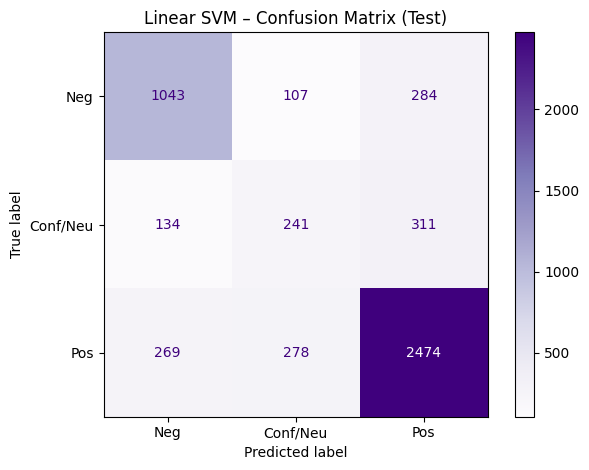

Probabilities shapes (val, test): (5140, 3) (5141, 3)


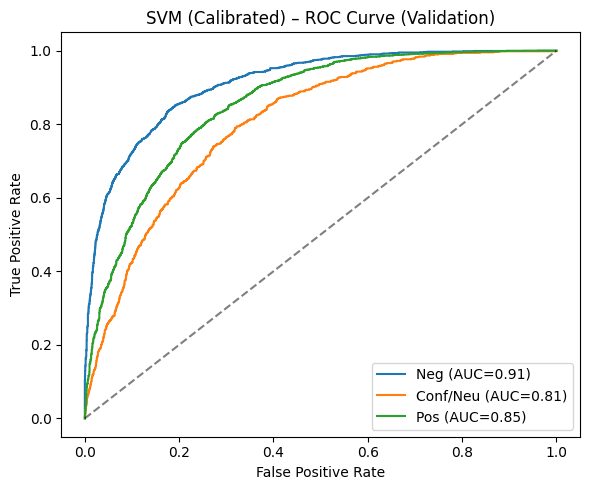

SVM (calibrated) macro AUC (val):  0.856994308095345
SVM (calibrated) macro AUC (test): 0.856928613758073


In [ ]:
# ================================
# SVM with TF-IDF (TRAIN + EVAL)
# ================================
import numpy as np
import matplotlib.pyplot as plt

from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
from sklearn.calibration import CalibratedClassifierCV

# Label names
label_names = [id2label[i] for i in sorted(id2label.keys())]

# ------------------------------------------------------------------
# 1) Train Linear SVM on TF-IDF ONLY (no combined embeddings)
# ------------------------------------------------------------------
svm_base = LinearSVC(
    class_weight=class_weight_dict,
    random_state=RANDOM_SEED,
    max_iter=3000
)

# small grid / almost no tuning so it's fast
svm_param_grid = {"C": [1.0]}

svm_grid = GridSearchCV(
    estimator=svm_base,
    param_grid=svm_param_grid,
    scoring="f1_macro",
    cv=3,
    n_jobs=-1,
    verbose=1
)

svm_grid.fit(X_train_tfidf, y_train)
best_svm = svm_grid.best_estimator_

print("Best SVM hyperparameters:", svm_grid.best_params_)

# ------------------------------------------------------------------
# 2) Validation + Test reports
# ------------------------------------------------------------------
y_val_pred_svm  = best_svm.predict(X_val_tfidf)
y_test_pred_svm = best_svm.predict(X_test_tfidf)

print("\n=== Linear SVM (val, tuned) ===")
print(classification_report(y_val, y_val_pred_svm, target_names=label_names))

print("=== Linear SVM (test, tuned) ===")
print(classification_report(y_test, y_test_pred_svm, target_names=label_names))

# ------------------------------------------------------------------
# 3) Confusion matrix on test
# ------------------------------------------------------------------
cm_svm = confusion_matrix(y_test, y_test_pred_svm)
print("\nConfusion matrix (SVM, test):")
print(cm_svm)

plt.figure(figsize=(5, 4))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=label_names)
disp.plot(cmap="Purples", values_format="d")
plt.title("Linear SVM – Confusion Matrix (Test)")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------------
# 4) Calibrated probabilities + ROC curves
# ------------------------------------------------------------------
svm_calibrated = CalibratedClassifierCV(best_svm, method="sigmoid", cv=3)
svm_calibrated.fit(X_train_tfidf, y_train)

y_val_proba_svm  = svm_calibrated.predict_proba(X_val_tfidf)
y_test_proba_svm = svm_calibrated.predict_proba(X_test_tfidf)

print("Probabilities shapes (val, test):", y_val_proba_svm.shape, y_test_proba_svm.shape)

# Binarize labels for ROC
y_val_bin  = label_binarize(y_val,  classes=[0, 1, 2])
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

# ROC on validation
plt.figure(figsize=(6, 5))
for i, name in enumerate(label_names):
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_val_proba_svm[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--", alpha=0.5)
plt.title("SVM (Calibrated) – ROC Curve (Validation)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()

# Macro AUC
svm_macro_auc_val  = roc_auc_score(y_val_bin,  y_val_proba_svm,  average="macro")
svm_macro_auc_test = roc_auc_score(y_test_bin, y_test_proba_svm, average="macro")

print("SVM (calibrated) macro AUC (val): ", svm_macro_auc_val)
print("SVM (calibrated) macro AUC (test):", svm_macro_auc_test)


In [ ]:
# ==========================================
# REAL-TIME PREDICTIONS + RISK (Linear SVM Calibrated)
# ==========================================
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

# TF-IDF → Calibrated SVM
X_example_svm = tfidf_vectorizer.transform(example_texts)
example_probs_svm = svm_calibrated.predict_proba(X_example_svm)
example_pred_svm = np.argmax(example_probs_svm, axis=1)

print("=== REAL-TIME PREDICTIONS (Linear SVM – Calibrated) ===")
for text, idx, prob in zip(example_texts, example_pred_svm, example_probs_svm):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== REAL-TIME PREDICTIONS (Linear SVM – Calibrated) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.676 0.104 0.22 ]

Text: Some weeks are clear, some are confusing. Overall it's okay but I am not fully confident.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.356 0.187 0.457]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.032 0.08  0.888]


In [ ]:
# ==========================================
# XAI 1 — Global Feature Importance (SVM)
# ==========================================
import pandas as pd

# Feature names from TF-IDF
feature_names = tfidf_vectorizer.get_feature_names_out()

coef = best_svm.coef_  # shape: (n_classes, n_features)

def top_features_for_class(class_idx, k=15):
    """
    Returns top positive and negative features for a given class index.
    """
    class_name = label_names[class_idx]
    w = coef[class_idx]

    # Top positive
    top_pos_idx = np.argsort(w)[-k:][::-1]
    top_pos = pd.DataFrame({
        "feature": feature_names[top_pos_idx],
        "coef": w[top_pos_idx],
        "odds_ratio": np.exp(w[top_pos_idx]),
        "class": class_name
    })

    # Top negative
    top_neg_idx = np.argsort(w)[:k]
    top_neg = pd.DataFrame({
        "feature": feature_names[top_neg_idx],
        "coef": w[top_neg_idx],
        "odds_ratio": np.exp(w[top_neg_idx]),
        "class": class_name
    })

    return top_pos, top_neg

for i, name in enumerate(label_names):
    print("\n===================================")
    print(f"🔹 Class: {name}")
    print("===================================\n")

    pos_df, neg_df = top_features_for_class(i, k=15)

    print("Top 15 POSITIVE features (push towards this class):\n")
    display(pos_df)

    print("\nTop 15 NEGATIVE features (push away from this class):\n")
    display(neg_df)



🔹 Class: Neg

Top 15 POSITIVE features (push towards this class):



,feature,coef,odds_ratio,class
0,boring,2.874155,17.710455,Neg
1,terrible,2.765303,15.883853,Neg
2,useless,2.704927,14.953225,Neg
3,awful,2.696798,14.832158,Neg
4,horrible,2.631171,13.890023,Neg
5,avoid,2.612822,13.637480,Neg
6,rude,2.305245,10.026637,Neg
7,bad,2.300059,9.974773,Neg
8,confusing,2.234168,9.338707,Neg
9,disorganized,2.200643,9.030814,Neg



Top 15 NEGATIVE features (push away from this class):



,feature,coef,odds_ratio,class
0,great,-3.970473,0.018865,Neg
1,fun,-3.198206,0.040835,Neg
2,interesting,-3.025230,0.048547,Neg
3,awesome,-2.591675,0.074894,Neg
4,love,-2.506326,0.081567,Neg
5,amazing,-2.499019,0.082166,Neg
6,enjoyable,-2.307879,0.099472,Neg
7,great teacher,-2.265857,0.103741,Neg
8,good,-2.261911,0.104151,Neg
9,interest,-2.169559,0.114228,Neg



🔹 Class: Conf/Neu

Top 15 POSITIVE features (push towards this class):



,feature,coef,odds_ratio,class
0,but,2.525091,12.492026,Conf/Neu
1,question we,2.432251,11.384483,Conf/Neu
2,discussion question,2.405425,11.083144,Conf/Neu
3,course she,2.315365,10.128615,Conf/Neu
4,me learn,2.166681,8.729264,Conf/Neu
5,dress,2.086301,8.055066,Conf/Neu
6,learn with,2.061907,7.860945,Conf/Neu
7,however,2.059761,7.844094,Conf/Neu
8,university have,2.020743,7.543930,Conf/Neu
9,he seem,2.019636,7.535585,Conf/Neu



Top 15 NEGATIVE features (push away from this class):



,feature,coef,odds_ratio,class
0,course,-3.011242,0.049230,Conf/Neu
1,useful,-2.724989,0.065547,Conf/Neu
2,teach he,-2.066868,0.126582,Conf/Neu
3,really didnt,-2.039497,0.130094,Conf/Neu
4,concept,-2.031945,0.131080,Conf/Neu
5,term,-2.005628,0.134576,Conf/Neu
6,have ever,-1.889663,0.151123,Conf/Neu
7,be amazing,-1.871278,0.153927,Conf/Neu
8,she even,-1.829407,0.160509,Conf/Neu
9,content,-1.818773,0.162225,Conf/Neu



🔹 Class: Pos

Top 15 POSITIVE features (push towards this class):



,feature,coef,odds_ratio,class
0,interesting,2.781585,16.144597,Pos
1,best,2.444647,11.526476,Pos
2,amaze,2.347777,10.462285,Pos
3,best teacher,2.209643,9.112464,Pos
4,fun course,2.159662,8.668208,Pos
5,excellent,2.073618,7.953547,Pos
6,awesome,2.061776,7.859916,Pos
7,great,1.960959,7.106138,Pos
8,fantastic,1.862673,6.440933,Pos
9,love,1.853960,6.385057,Pos



Top 15 NEGATIVE features (push away from this class):



,feature,coef,odds_ratio,class
0,boring,-2.701741,0.067089,Pos
1,bad,-2.299038,0.100355,Pos
2,confusing,-2.285035,0.101770,Pos
3,horrible,-2.261395,0.104205,Pos
4,waste,-2.161468,0.115156,Pos
5,avoid,-2.157088,0.115661,Pos
6,useless,-2.079534,0.124988,Pos
7,confuse,-2.013396,0.133534,Pos
8,waste of,-2.000377,0.135284,Pos
9,bore,-1.993921,0.136160,Pos


In [ ]:
# ==========================================================
# XAI 2 — LIME + REAL-TIME DEMO + RISK LEVEL (SVM)
# ==========================================================
from lime.lime_text import LimeTextExplainer

# 1) Prediction function for LIME (uses TF-IDF + calibrated SVM)
def predict_proba_lime(texts):
    X = tfidf_vectorizer.transform(texts)
    return svm_calibrated.predict_proba(X)

explainer_svm = LimeTextExplainer(class_names=label_names)

# Choose an example from validation set
example_idx = 10  # change index if needed
text_example = X_val_text.iloc[example_idx]

# y_val is a NumPy array
true_label = label_names[int(y_val[example_idx])]

print(f"Explaining text (index {example_idx})")
print("True label:", true_label)
print("\nText:\n", text_example)

exp_svm = explainer_svm.explain_instance(
    text_example,
    predict_proba_lime,
    num_features=10,
    labels=list(range(len(label_names)))   # <-- ask for ALL classes
)

# Print contributions per class
for class_idx, class_name in enumerate(label_names):
    print(f"\n--- LIME explanation for {class_name} ---")
    for word, weight in exp_svm.as_list(label=class_idx):
        print(f"{word:25s} {weight:+.4f}")

# Render HTML in notebook
exp_svm.show_in_notebook(text=True)


# ----------------------------------------------------------
# 2) REAL-TIME PREDICTIONS + RISK LEVEL (using the same SVM)
# ----------------------------------------------------------
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

# Risk mapping
risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

# Predict labels + probabilities
X_example = tfidf_vectorizer.transform(example_texts)
example_probs = svm_calibrated.predict_proba(X_example)
example_pred_idx = np.argmax(example_probs, axis=1)

print("\n=== REAL-TIME PREDICTIONS WITH RISK LEVEL (Linear SVM) ===")
for text, idx, prob in zip(example_texts, example_pred_idx, example_probs):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


Explaining text (index 10)
True label: Pos

Text:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity

--- LIME explanation for Neg ---
amazing                   -0.0946
not                       +0.0710
poor                      +0.0680
fair                      -0.0631
dry                       +0.0628
this                      +0.0599
interesting               -0.0583
recommend              


=== REAL-TIME PREDICTIONS WITH RISK LEVEL (Linear SVM) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.676 0.104 0.22 ]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.356 0.187 0.457]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.032 0.08  0.888]


#**DEEP LEARNING SETUP**

In [ ]:
# ANN – SVD features + training
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.decomposition import TruncatedSVD

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

# 1) Reduce TF-IDF dimensionality for ANN
n_components = 300   # good trade-off (can change to 200/400)
svd_ann = TruncatedSVD(
    n_components=n_components,
    random_state=RANDOM_SEED
)

X_train_ann = svd_ann.fit_transform(X_train_tfidf)
X_val_ann   = svd_ann.transform(X_val_tfidf)
X_test_ann  = svd_ann.transform(X_test_tfidf)

print("SVD shapes:")
print("  Train:", X_train_ann.shape)
print("  Val  :", X_val_ann.shape)
print("  Test :", X_test_ann.shape)

num_features = n_components
num_classes  = 3

# 2) Build a compact ANN (fast & light)
ann_model = models.Sequential([
    layers.Input(shape=(num_features,)),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(num_classes, activation='softmax')
])

ann_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

ann_model.summary()

# 3) Train
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=1,
    restore_best_weights=True
)

history_ann = ann_model.fit(
    X_train_ann, y_train,
    validation_data=(X_val_ann, y_val),
    epochs=6,
    batch_size=256,
    callbacks=[callback],
    verbose=1
)


SVD shapes:
  Train: (23986, 300)
  Val  : (5140, 300)
  Test : (5141, 300)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │        77,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,339 (431.01 KB)

 Trainable params: 110,339 (431.01 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.5758 - loss: 0.9468 - val_accuracy: 0.7274 - val_loss: 0.6665
Epoch 2/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7357 - loss: 0.6375 - val_accuracy: 0.7383 - val_loss: 0.6138
Epoch 3/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7534 - loss: 0.5910 - val_accuracy: 0.7428 - val_loss: 0.6043
Epoch 4/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7616 - loss: 0.5693 - val_accuracy: 0.7484 - val_loss: 0.5993
Epoch 5/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7716 - loss: 0.5495 - val_accuracy: 0.7461 - val_loss: 0.5960
Epoch 6/6
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7756 - loss: 0.5360 - val_accuracy: 0.7484 - val_loss: 0.5941


161/161 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
161/161 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
=== ANN (val) ===
              precision    recall  f1-score   support

         Neg       0.73      0.69      0.71      1433
    Conf/Neu       0.53      0.23      0.32       686
         Pos       0.78      0.89      0.83      3021

    accuracy                           0.75      5140
   macro avg       0.68      0.61      0.62      5140
weighted avg       0.73      0.75      0.73      5140

=== ANN (test) ===
              precision    recall  f1-score   support

         Neg       0.74      0.69      0.71      1434
    Conf/Neu       0.51      0.23      0.32       686
         Pos       0.78      0.89      0.83      3021

    accuracy                           0.75      5141
   macro avg       0.67      0.61      0.62      5141
weighted avg       0.73      0.75      0.73      5141


Confusion matrix (ANN, test):
[[ 991   69  374]
 [ 118  160  408]
 [ 234   87 2700]]


<Figure size 500x400 with 0 Axes>

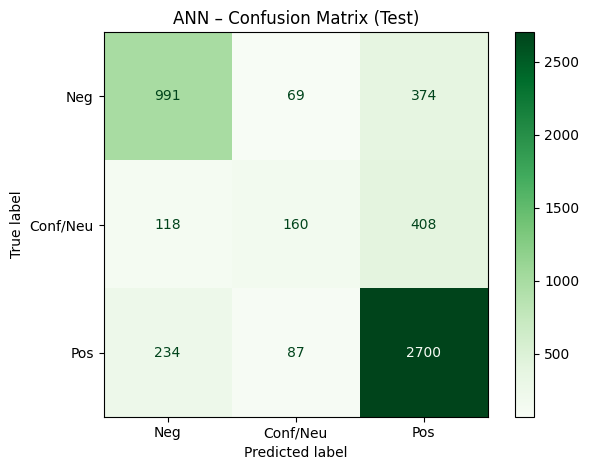

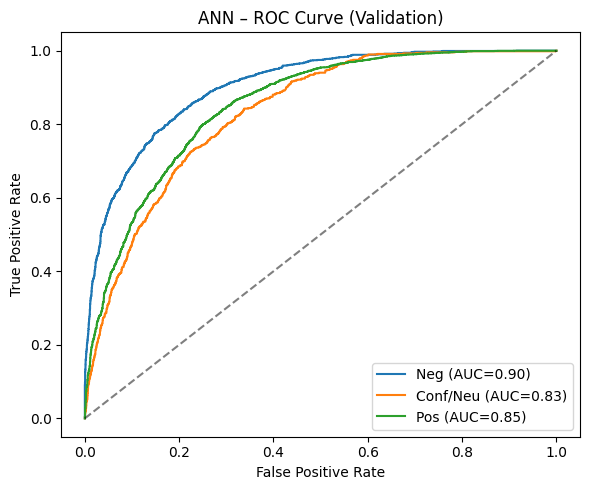

ANN macro AUC (val):  0.862426804203858
ANN macro AUC (test): 0.8637713060982929

Explaining text (index 10)
True label: Pos

Text:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [ ]:
# ANN – EVAL + LIME + RISK DEMO
import matplotlib.pyplot as plt
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
from lime.lime_text import LimeTextExplainer

label_names = ["Neg", "Conf/Neu", "Pos"]

# 1) Predictions (val + test)
y_val_proba_ann  = ann_model.predict(X_val_ann)
y_test_proba_ann = ann_model.predict(X_test_ann)

y_val_pred_ann  = np.argmax(y_val_proba_ann, axis=1)
y_test_pred_ann = np.argmax(y_test_proba_ann, axis=1)

print("=== ANN (val) ===")
print(classification_report(y_val, y_val_pred_ann, target_names=label_names))

print("=== ANN (test) ===")
print(classification_report(y_test, y_test_pred_ann, target_names=label_names))

# 2) Confusion matrix (test)
cm_ann = confusion_matrix(y_test, y_test_pred_ann)
print("\nConfusion matrix (ANN, test):")
print(cm_ann)

plt.figure(figsize=(5, 4))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_ann, display_labels=label_names)
disp.plot(cmap="Greens", values_format="d")
plt.title("ANN – Confusion Matrix (Test)")
plt.tight_layout()
plt.show()

# 3) ROC (macro AUC)
y_val_bin  = label_binarize(y_val,  classes=[0, 1, 2])
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])

plt.figure(figsize=(6, 5))
for i, name in enumerate(label_names):
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_val_proba_ann[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--", alpha=0.5)
plt.title("ANN – ROC Curve (Validation)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.tight_layout()
plt.show()

ann_macro_auc_val  = roc_auc_score(y_val_bin,  y_val_proba_ann,  average="macro")
ann_macro_auc_test = roc_auc_score(y_test_bin, y_test_proba_ann, average="macro")
print("ANN macro AUC (val): ", ann_macro_auc_val)
print("ANN macro AUC (test):", ann_macro_auc_test)

# 4) LIME for ANN – local explanation on one review
def predict_proba_ann_lime(texts):
    X_tfidf = tfidf_vectorizer.transform(texts)
    X_svd   = svd_ann.transform(X_tfidf)
    return ann_model.predict(X_svd)

explainer_ann = LimeTextExplainer(class_names=label_names)

example_idx = 10
text_example = X_val_text.iloc[example_idx]
true_label   = label_names[int(y_val[example_idx])]

print(f"\nExplaining text (index {example_idx})")
print("True label:", true_label)
print("\nText:\n", text_example)

exp_ann = explainer_ann.explain_instance(
    text_example,
    predict_proba_ann_lime,
    num_features=10
)

exp_ann.show_in_notebook(text=True)

# 5) REAL-TIME DEMO + RISK
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk"
}

X_example_tfidf = tfidf_vectorizer.transform(example_texts)
X_example_ann   = svd_ann.transform(X_example_tfidf)
example_probs   = ann_model.predict(X_example_ann)
example_pred    = np.argmax(example_probs, axis=1)

print("\n=== REAL-TIME PREDICTIONS WITH RISK LEVEL (ANN) ===")
for text, idx, prob in zip(example_texts, example_pred, example_probs):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


In [ ]:
# ANN – REAL-TIME PREDICTIONS + RISK LEVEL
import numpy as np

label_names = ["Neg", "Conf/Neu", "Pos"]

risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk",
}

# Example raw reviews (change these for viva)
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

def basic_clean(t):
    return t.lower().strip()

# 1) Text → TF-IDF → SVD features (same pipeline as training)
example_clean = [basic_clean(t) for t in example_texts]
X_ex_tfidf = tfidf_vectorizer.transform(example_clean)
X_ex_ann   = svd_ann.transform(X_ex_tfidf)

# 2) ANN probabilities + predicted labels
probs_ann = ann_model.predict(X_ex_ann)
pred_idx  = np.argmax(probs_ann, axis=1)

print("\n=== REAL-TIME PREDICTIONS WITH RISK LEVEL (ANN) ===")
for text, idx, p in zip(example_texts, pred_idx, probs_ann):
    label = label_names[idx]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk Level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(p, 3))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step

=== REAL-TIME PREDICTIONS WITH RISK LEVEL (ANN) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk Level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.487 0.233 0.28 ]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.195 0.258 0.548]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk Level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.021 0.062 0.917]


In [ ]:
# TRAINING (BiLSTM)

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Reuse random seed + splits + label dicts you already created earlier
tf.random.set_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Text splits (same as classical models)
X_train_text = df_fe.loc[train_idx, "text_clean"].astype(str).tolist()
X_val_text   = df_fe.loc[val_idx,   "text_clean"].astype(str).tolist()
X_test_text  = df_fe.loc[test_idx,  "text_clean"].astype(str).tolist()

y_train_dl = y_train.copy()
y_val_dl   = y_val.copy()
y_test_dl  = y_test.copy()

# Tokenisation / padding
MAX_WORDS = 30000
MAX_LEN   = 150

tokenizer = Tokenizer(num_words=MAX_WORDS, oov_token="<UNK>")
tokenizer.fit_on_texts(X_train_text)

X_train_seq = tokenizer.texts_to_sequences(X_train_text)
X_val_seq   = tokenizer.texts_to_sequences(X_val_text)
X_test_seq  = tokenizer.texts_to_sequences(X_test_text)

X_train_pad = pad_sequences(X_train_seq, maxlen=MAX_LEN, padding="post", truncating="post")
X_val_pad   = pad_sequences(X_val_seq,   maxlen=MAX_LEN, padding="post", truncating="post")
X_test_pad  = pad_sequences(X_test_seq,  maxlen=MAX_LEN, padding="post", truncating="post")

vocab_size = min(MAX_WORDS, len(tokenizer.word_index) + 1)
print("Vocab size:", vocab_size)
print("Train seq shape:", X_train_pad.shape)
print("Val seq shape  :", X_val_pad.shape)
print("Test seq shape :", X_test_pad.shape)
print("id2label:", id2label)
print("class_weight_dict:", class_weight_dict)

# ---------- BiLSTM model ----------

def build_bilstm_model(vocab_size, max_len, n_classes=3, emb_dim=128, lstm_units=64):
    model = models.Sequential()
    model.add(layers.Embedding(
        input_dim=vocab_size,
        output_dim=emb_dim,
        input_shape=(max_len,)      # avoids "unbuilt" summary + deprecation warning
    ))
    model.add(layers.Bidirectional(layers.LSTM(lstm_units, return_sequences=True)))
    model.add(layers.GlobalMaxPooling1D())
    model.add(layers.Dense(64, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(n_classes, activation="softmax"))

    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        metrics=["accuracy"],
    )
    return model

bilstm_model = build_bilstm_model(
    vocab_size=vocab_size,
    max_len=MAX_LEN,
    n_classes=len(label2id)
)

# build explicitly so summary shows params
bilstm_model.build(input_shape=(None, MAX_LEN))
bilstm_model.summary()

bilstm_ckpt = "bilstm_best.keras"

es = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True,
    verbose=1,
)

mc = ModelCheckpoint(
    filepath=bilstm_ckpt,
    monitor="val_loss",
    save_best_only=True,
    verbose=1,
)

history_bilstm = bilstm_model.fit(
    X_train_pad,
    y_train_dl,
    validation_data=(X_val_pad, y_val_dl),
    epochs=10,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[es, mc],
    verbose=1,
)


Vocab size: 14872
Train seq shape: (23986, 150)
Val seq shape  : (5140, 150)
Test seq shape : (5141, 150)
id2label: {0: 'Neg', 1: 'Conf/Neu', 2: 'Pos'}
class_weight_dict: {0: 1.1951170901843549, 1: 2.499322705011983, 2: 0.5671655907876381}


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:100: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 150, 128)       │     1,903,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 150, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,010,883 (7.67 MB)

 Trainable params: 2,010,883 (7.67 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.4397 - loss: 0.9977
Epoch 1: val_loss improved from inf to 0.73470, saving model to bilstm_best.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - accuracy: 0.4402 - loss: 0.9971 - val_accuracy: 0.6601 - val_loss: 0.7347
Epoch 2/10
186/188 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.6839 - loss: 0.6888
Epoch 2: val_loss did not improve from 0.73470
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6841 - loss: 0.6884 - val_accuracy: 0.6232 - val_loss: 0.7855
Epoch 3/10
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7338 - loss: 0.5839
Epoch 3: val_loss did not improve from 0.73470
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.7338 - loss: 0.5837 - val_accuracy: 0.6607 - val_loss: 0.7374
Epoch 4/10
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.7715 - loss: 0.4987
Epoch 4: val_loss did not improve from 0.73470
188/188 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.7716 - loss: 0.498

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
=== BiLSTM – Validation ===
              precision    recall  f1-score   support

         Neg       0.62      0.82      0.71      1433
    Conf/Neu       0.35      0.59      0.44       686
         Pos       0.87      0.60      0.71      3021

    accuracy                           0.66      5140
   macro avg       0.61      0.67      0.62      5140
weighted avg       0.73      0.66      0.67      5140



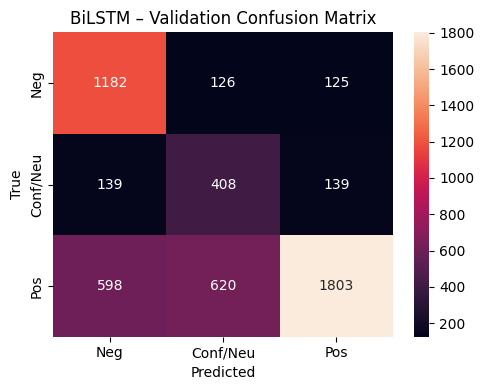

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

=== BiLSTM – Test ===
              precision    recall  f1-score   support

         Neg       0.60      0.81      0.69      1434
    Conf/Neu       0.33      0.57      0.42       686
         Pos       0.87      0.58      0.69      3021

    accuracy                           0.64      5141
   macro avg       0.60      0.65      0.60      5141
weighted avg       0.72      0.64      0.66      5141



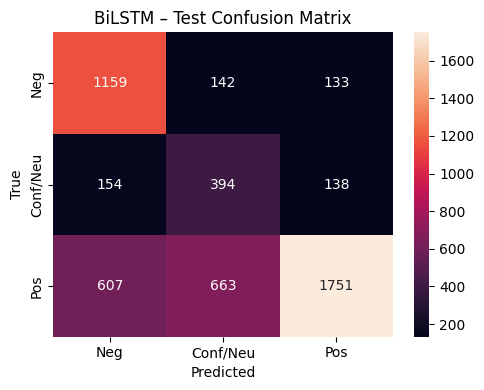

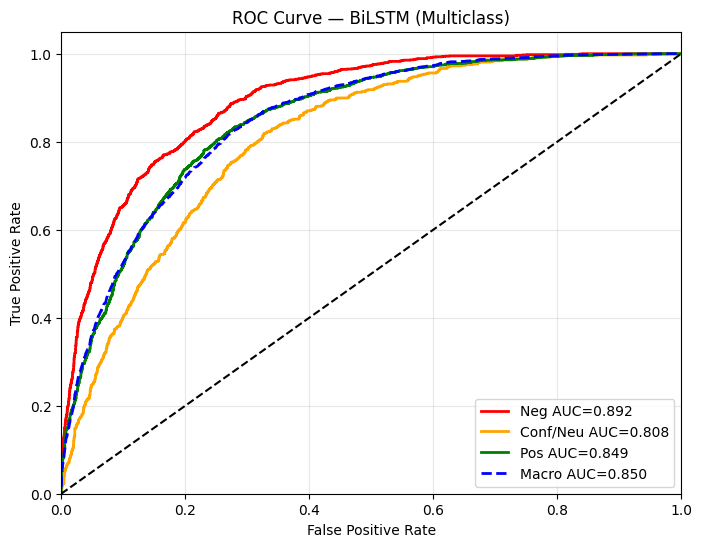

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# reload best BiLSTM weights
bilstm_model.load_weights(bilstm_ckpt)

label_names = [id2label[i] for i in range(len(label2id))]

# ===== Validation =====
y_val_probs_bilstm = bilstm_model.predict(X_val_pad, batch_size=256, verbose=1)
y_val_pred_bilstm  = np.argmax(y_val_probs_bilstm, axis=1)

print("=== BiLSTM – Validation ===")
print(classification_report(y_val_dl, y_val_pred_bilstm, target_names=label_names))

cm_val_bilstm = confusion_matrix(y_val_dl, y_val_pred_bilstm)
plt.figure(figsize=(5,4))
sns.heatmap(cm_val_bilstm, annot=True, fmt="d",
            xticklabels=label_names, yticklabels=label_names)
plt.title("BiLSTM – Validation Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

# ===== Test =====
y_test_probs_bilstm = bilstm_model.predict(X_test_pad, batch_size=256, verbose=1)
y_test_pred_bilstm  = np.argmax(y_test_probs_bilstm, axis=1)

print("\n=== BiLSTM – Test ===")
print(classification_report(y_test_dl, y_test_pred_bilstm, target_names=label_names))

cm_test_bilstm = confusion_matrix(y_test_dl, y_test_pred_bilstm)
plt.figure(figsize=(5,4))
sns.heatmap(cm_test_bilstm, annot=True, fmt="d",
            xticklabels=label_names, yticklabels=label_names)
plt.title("BiLSTM – Test Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

# ===== ROC Curve (multiclass, test set) =====
y_test_true = y_test_dl
y_test_bin  = label_binarize(y_test_true, classes=[0,1,2])
fpr, tpr, roc_auc = {}, {}, {}

for i in [0,1,2]:
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_test_probs_bilstm[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in [0,1,2]]))
mean_tpr = np.zeros_like(all_fpr)
for i in [0,1,2]:
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= 3
roc_auc_macro = auc(all_fpr, mean_tpr)

plt.figure(figsize=(8,6))
colors = ["red", "orange", "green"]
for i, c in zip([0,1,2], colors):
    plt.plot(fpr[i], tpr[i], c, lw=2,
             label=f"{id2label[i]} AUC={roc_auc[i]:.3f}")

plt.plot(all_fpr, mean_tpr, "b--", lw=2,
         label=f"Macro AUC={roc_auc_macro:.3f}")
plt.plot([0,1],[0,1],"k--")
plt.xlim([0,1]); plt.ylim([0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve — BiLSTM (Multiclass)")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()


In [ ]:
# BiLSTM — LIME TEXT XAI + REAL-TIME PREDICTIONS + RISK
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

label_names = ["Neg", "Conf/Neu", "Pos"]
risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk",
}

MAX_LEN = 150  # same as used in your BiLSTM training

# ---------- 1) LIME wrapper for BiLSTM ----------
def bilstm_predict_proba(texts):
    seqs = tokenizer.texts_to_sequences(texts)
    pads = pad_sequences(seqs, maxlen=MAX_LEN, padding="post", truncating="post")
    return bilstm_model.predict(pads)

explainer_bilstm = LimeTextExplainer(class_names=label_names)

# Pick one validation example to explain
example_idx = 10  # change if you want
y_val_array = np.array(y_val_dl)
text_example = X_val_text[example_idx]
true_label  = label_names[int(y_val_array[example_idx])]

print(f"=== BiLSTM — LIME EXPLANATION (val index {example_idx}) ===")
print("True label:", true_label)
print("\nText:\n", text_example)

exp_bilstm = explainer_bilstm.explain_instance(
    text_example,
    bilstm_predict_proba,
    num_features=10
)

# Nice HTML view (with highlighted tokens)
exp_bilstm.show_in_notebook(text=True)

# ---------- 2) REAL-TIME PREDICTIONS + RISK (BiLSTM) ----------
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

seqs_ex = tokenizer.texts_to_sequences(example_texts)
pads_ex = pad_sequences(seqs_ex, maxlen=MAX_LEN, padding="post", truncating="post")
probs_ex = bilstm_model.predict(pads_ex)
pred_idx = np.argmax(probs_ex, axis=1)

print("\n=== REAL-TIME PREDICTIONS + RISK (BiLSTM) ===")
for text, idx, prob in zip(example_texts, pred_idx, probs_ex):
    label = label_names[int(idx)]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== BiLSTM — LIME EXPLANATION (val index 10) ===
True label: Pos

Text:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step

=== REAL-TIME PREDICTIONS + RISK (BiLSTM) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.805 0.1   0.095]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Conf/Neu
Risk level: Medium Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.234 0.477 0.288]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.037 0.158 0.806]


In [ ]:
#  CNN MODEL: BUILD + TRAIN

import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

tf.random.set_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

n_classes = len(id2label)

def build_cnn_model(vocab_size, max_len, n_classes=3,
                    emb_dim=128, num_filters=128, kernel_size=3):
    model = models.Sequential()
    model.add(layers.Embedding(
        input_dim=vocab_size,
        output_dim=emb_dim,
        input_shape=(max_len,)
    ))
    model.add(layers.Conv1D(
        filters=num_filters,
        kernel_size=kernel_size,
        activation="relu"
    ))
    model.add(layers.GlobalMaxPooling1D())
    model.add(layers.Dense(64, activation="relu"))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(n_classes, activation="softmax"))

    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        metrics=["accuracy"],
    )
    return model

cnn_model = build_cnn_model(
    vocab_size=vocab_size,
    max_len=MAX_LEN,
    n_classes=n_classes
)

cnn_model.build(input_shape=(None, MAX_LEN))
cnn_model.summary()

cnn_ckpt = "cnn_best.keras"

es_cnn = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True,
    verbose=1,
)

mc_cnn = ModelCheckpoint(
    filepath=cnn_ckpt,
    monitor="val_loss",
    save_best_only=True,
    verbose=1,
)

history_cnn = cnn_model.fit(
    X_train_pad,
    y_train_dl,
    validation_data=(X_val_pad, y_val_dl),
    epochs=10,
    batch_size=128,
    class_weight=class_weight_dict,
    callbacks=[es_cnn, mc_cnn],
    verbose=1,
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:100: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (None, 150, 128)       │     1,903,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 148, 128)       │        49,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (None, 128)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,961,347 (7.48 MB)

 Trainable params: 1,961,347 (7.48 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.4381 - loss: 1.0018
Epoch 1: val_loss improved from inf to 0.73704, saving model to cnn_best.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step - accuracy: 0.4386 - loss: 1.0012 - val_accuracy: 0.6430 - val_loss: 0.7370
Epoch 2/10
181/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6738 - loss: 0.6946
Epoch 2: val_loss improved from 0.73704 to 0.69333, saving model to cnn_best.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6746 - loss: 0.6933 - val_accuracy: 0.6759 - val_loss: 0.6933
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7497 - loss: 0.5555
Epoch 3: val_loss did not improve from 0.69333
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7498 - loss: 0.5553 - val_accuracy: 0.6887 - val_loss: 0.7007
Epoch 4/10
186/188 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8279 - loss: 0.4077
Epoch 4: val_loss did not improve from 0.69333
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - 

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
=== CNN – Validation ===
              precision    recall  f1-score   support

         Neg       0.65      0.82      0.73      1433
    Conf/Neu       0.35      0.58      0.44       686
         Pos       0.86      0.63      0.73      3021

    accuracy                           0.68      5140
   macro avg       0.62      0.68      0.63      5140
weighted avg       0.73      0.68      0.69      5140



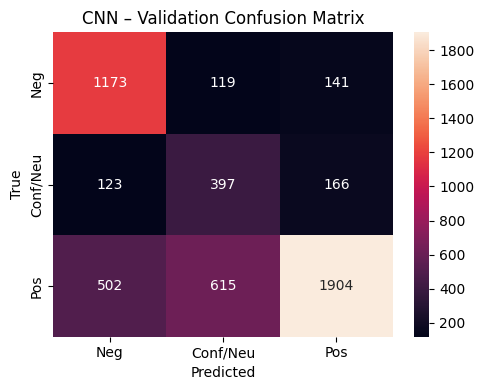

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

=== CNN – Test ===
              precision    recall  f1-score   support

         Neg       0.64      0.81      0.71      1434
    Conf/Neu       0.34      0.59      0.43       686
         Pos       0.86      0.61      0.72      3021

    accuracy                           0.66      5141
   macro avg       0.61      0.67      0.62      5141
weighted avg       0.73      0.66      0.68      5141



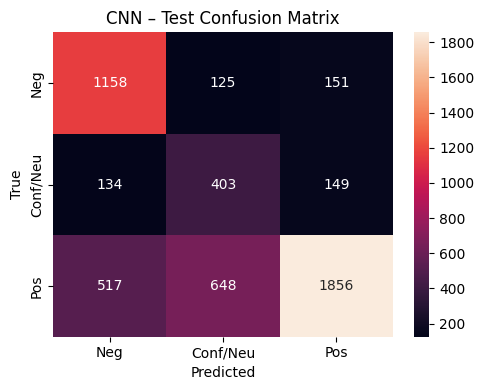

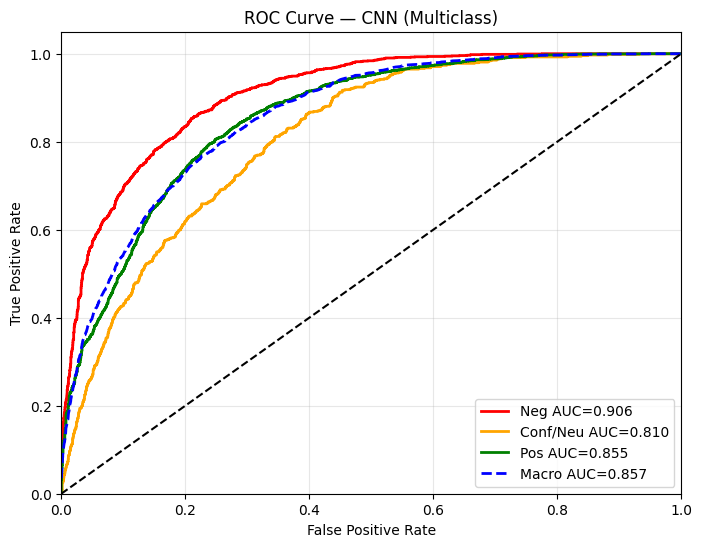

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# Validation evaluation
y_val_probs_cnn = cnn_model.predict(X_val_pad, batch_size=256, verbose=1)
y_val_pred_cnn = np.argmax(y_val_probs_cnn, axis=1)

print("=== CNN – Validation ===")
print(classification_report(y_val_dl, y_val_pred_cnn, target_names=[id2label[0], id2label[1], id2label[2]]))

cm_val = confusion_matrix(y_val_dl, y_val_pred_cnn)
plt.figure(figsize=(5,4))
sns.heatmap(cm_val, annot=True, fmt="d",
            xticklabels=[id2label[0],id2label[1],id2label[2]],
            yticklabels=[id2label[0],id2label[1],id2label[2]])
plt.title("CNN – Validation Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

# Test evaluation
y_test_probs_cnn = cnn_model.predict(X_test_pad, batch_size=256, verbose=1)
y_test_pred_cnn = np.argmax(y_test_probs_cnn, axis=1)

print("\n=== CNN – Test ===")
print(classification_report(y_test_dl, y_test_pred_cnn, target_names=[id2label[0],id2label[1],id2label[2]]))

cm_test = confusion_matrix(y_test_dl, y_test_pred_cnn)
plt.figure(figsize=(5,4))
sns.heatmap(cm_test, annot=True, fmt="d",
            xticklabels=[id2label[0],id2label[1],id2label[2]],
            yticklabels=[id2label[0],id2label[1],id2label[2]])
plt.title("CNN – Test Confusion Matrix")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()

# ROC Curve
y_bin = label_binarize(y_test_dl, classes=[0,1,2])
fpr, tpr, roc_auc = {}, {}, {}

for i in [0,1,2]:
    fpr[i], tpr[i], _ = roc_curve(y_bin[:,i], y_test_probs_cnn[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in [0,1,2]]))
mean_tpr = np.zeros_like(all_fpr)
for i in [0,1,2]:
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= 3
roc_auc_macro = auc(all_fpr, mean_tpr)

plt.figure(figsize=(8,6))
colors = ["red","orange","green"]
labels = [id2label[0], id2label[1], id2label[2]]

for i, c in zip([0,1,2], colors):
    plt.plot(fpr[i], tpr[i], c, lw=2, label=f"{labels[i]} AUC={roc_auc[i]:.3f}")

plt.plot(all_fpr, mean_tpr, "b--", lw=2, label=f"Macro AUC={roc_auc_macro:.3f}")
plt.plot([0,1],[0,1],"k--"); plt.xlim([0,1]); plt.ylim([0,1.05])
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("ROC Curve — CNN (Multiclass)")
plt.legend(loc="lower right"); plt.grid(alpha=0.3)
plt.show()


In [ ]:
# CNN — LIME TEXT XAI + REAL-TIME PREDICTIONS + RISK
from lime.lime_text import LimeTextExplainer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

label_names = ["Neg", "Conf/Neu", "Pos"]
risk_map = {
    "Neg": "High Risk",
    "Conf/Neu": "Medium Risk",
    "Pos": "Low Risk",
}

MAX_LEN = 150  # same as used in CNN training

# ---------- 1) LIME wrapper for CNN ----------
def cnn_predict_proba(texts):
    seqs = tokenizer.texts_to_sequences(texts)
    pads = pad_sequences(seqs, maxlen=MAX_LEN, padding="post", truncating="post")
    return cnn_model.predict(pads)

explainer_cnn = LimeTextExplainer(class_names=label_names)

# Pick one validation example to explain
example_idx = 10  # change if you want
y_val_array = np.array(y_val_dl)
text_example = X_val_text[example_idx]
true_label  = label_names[int(y_val_array[example_idx])]

print(f"=== CNN — LIME EXPLANATION (val index {example_idx}) ===")
print("True label:", true_label)
print("\nText:\n", text_example)

exp_cnn = explainer_cnn.explain_instance(
    text_example,
    cnn_predict_proba,
    num_features=10
)

exp_cnn.show_in_notebook(text=True)

# ---------- 2) REAL-TIME PREDICTIONS + RISK (CNN) ----------
example_texts = [
    "The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.",
    "Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.",
    "The lecturer is amazing, explains everything clearly and the module is very engaging."
]

seqs_ex = tokenizer.texts_to_sequences(example_texts)
pads_ex = pad_sequences(seqs_ex, maxlen=MAX_LEN, padding="post", truncating="post")
probs_ex = cnn_model.predict(pads_ex)
pred_idx = np.argmax(probs_ex, axis=1)

print("\n=== REAL-TIME PREDICTIONS + RISK (CNN) ===")
for text, idx, prob in zip(example_texts, pred_idx, probs_ex):
    label = label_names[int(idx)]
    risk  = risk_map[label]
    print("\nText:", text)
    print("Predicted label:", label)
    print("Risk level:", risk)
    print("Class probabilities [Neg, Conf/Neu, Pos]:", np.round(prob, 3))


=== CNN — LIME EXPLANATION (val index 10) ===
True label: Pos

Text:
 think that be not neg_go neg_to neg_like this course at all and that it be go to be dry it be not neg_at neg_all this course be an incredibly important and amazing course which touch on the philosophy of compute elaborate on material learn in and provide concrete and interesting proof and argument towards many well known conclusion such the halting problem the final grade receive in this course be felt that all of the assignment and exam minus the final assignment which felt be unfair be fair though challenging and that my relatively poor performance be entirely my own highly recommend take this course with teacher if you be give the opportunity
157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step

=== REAL-TIME PREDICTIONS + RISK (CNN) ===

Text: The lectures are poorly structured and I rarely understand the topics. Overall, this module feels frustrating.
Predicted label: Neg
Risk level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.914 0.058 0.028]

Text: Some weeks are clear, some are confusing, overall it's okay but I am not fully confident.
Predicted label: Neg
Risk level: High Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.452 0.401 0.147]

Text: The lecturer is amazing, explains everything clearly and the module is very engaging.
Predicted label: Pos
Risk level: Low Risk
Class probabilities [Neg, Conf/Neu, Pos]: [0.013 0.114 0.873]


# **DistilBERT**

In [ ]:
!pip install -q transformers datasets scikit-learn

import numpy as np
import torch
import matplotlib.pyplot as plt

from datasets import Dataset, DatasetDict
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    DataCollatorWithPadding,
    TrainingArguments,
    Trainer
)
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# 1) Build HF datasets (subsampled for speed)
X_train_list = list(X_train_text)
X_val_list   = list(X_val_text)
X_test_list  = list(X_test_text)

y_train_list = [int(x) for x in y_train]
y_val_list   = [int(x) for x in y_val]
y_test_list  = [int(x) for x in y_test]

train_n = min(12000, len(X_train_list))
val_n   = min(3000, len(X_val_list))
test_n  = min(3000, len(X_test_list))

train_ds = Dataset.from_dict({
    "text":  X_train_list[:train_n],
    "label": y_train_list[:train_n]
})
val_ds = Dataset.from_dict({
    "text":  X_val_list[:val_n],
    "label": y_val_list[:val_n]
})
test_ds = Dataset.from_dict({
    "text":  X_test_list[:test_n],
    "label": y_test_list[:test_n]
})

raw_datasets = DatasetDict({
    "train": train_ds,
    "validation": val_ds,
    "test": test_ds
})

print(f"Train: {len(train_ds)}, Val: {len(val_ds)}, Test: {len(test_ds)}")

# 2) Tokenisation
model_name = "distilbert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize_fn(batch):
    return tokenizer(
        batch["text"],
        truncation=True,
        padding=False,
        max_length=128,
    )

tokenized_datasets = raw_datasets.map(tokenize_fn, batched=True)
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# 3) Model + metrics + Trainer
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "macro_f1": f1_score(labels, preds, average="macro"),
        "weighted_f1": f1_score(labels, preds, average="weighted"),
    }

model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=3,
)

training_args = TrainingArguments(
    output_dir="distilbert-final",
    num_train_epochs=1,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=32,
    learning_rate=2e-5,
    weight_decay=0.01,
    logging_steps=100,
    save_steps=5000,
    fp16=(device == "cuda"),
    report_to="none",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

# 4) Train
print("\n=== Training DistilBERT (final) ===")
trainer.train()

Using device: cuda
Train: 12000, Val: 3000, Test: 3000


Map:   0%|          | 0/12000 [00:00<?, ? examples/s]

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Map:   0%|          | 0/3000 [00:00<?, ? examples/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipython-input-3139088903.py:114: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(



=== Training DistilBERT (final) ===


Step,Training Loss
100,0.814400
200,0.637800
300,0.668500
400,0.597500
500,0.560800
600,0.602200
700,0.589300


TrainOutput(global_step=750, training_loss=0.6325608698527018, metrics={'train_runtime': 64.2783, 'train_samples_per_second': 186.688, 'train_steps_per_second': 11.668, 'total_flos': 322638382334016.0, 'train_loss': 0.6325608698527018, 'epoch': 1.0})


=== DistilBERT – Validation metrics ===


{'eval_loss': 0.5505676865577698, 'eval_accuracy': 0.7736666666666666, 'eval_macro_f1': 0.6381611503353993, 'eval_weighted_f1': 0.7532464056732896, 'eval_runtime': 3.6874, 'eval_samples_per_second': 813.571, 'eval_steps_per_second': 25.492, 'epoch': 1.0}

=== DistilBERT – Test metrics ===
{'eval_loss': 0.5699096918106079, 'eval_accuracy': 0.7663333333333333, 'eval_macro_f1': 0.6056777612488999, 'eval_weighted_f1': 0.7398784586295539, 'eval_runtime': 4.7787, 'eval_samples_per_second': 627.79, 'eval_steps_per_second': 19.671, 'epoch': 1.0}

=== DistilBERT – Test classification report ===
              precision    recall  f1-score   support

         Neg       0.75      0.71      0.73       829
    Conf/Neu       0.46      0.16      0.23       380
         Pos       0.79      0.92      0.85      1791

    accuracy                           0.77      3000
   macro avg       0.67      0.60      0.61      3000
weighted avg       0.74      0.77      0.74      3000



<Figure size 600x500 with 0 Axes>

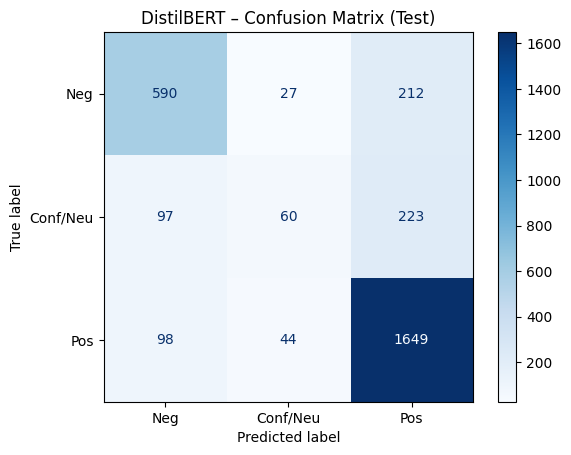

In [ ]:
# 5) Validation + Test evaluation
# -------------------------
print("\n=== DistilBERT – Validation metrics ===")
val_metrics = trainer.evaluate(tokenized_datasets["validation"])
print(val_metrics)

print("\n=== DistilBERT – Test metrics ===")
test_metrics = trainer.evaluate(tokenized_datasets["test"])
print(test_metrics)

# Detailed classification report on test set
print("\n=== DistilBERT – Test classification report ===")
pred_test = trainer.predict(tokenized_datasets["test"])
y_test_pred = np.argmax(pred_test.predictions, axis=-1)
print(classification_report(y_test_list[:test_n], y_test_pred, target_names=labels))

# Confusion matrix
cm = confusion_matrix(y_test_list[:test_n], y_test_pred)
plt.figure(figsize=(6, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap="Blues", values_format="d")
plt.title("DistilBERT – Confusion Matrix (Test)")
plt.show()

In [ ]:
# SHAP XAI for DistilBERT – word-level contribution + predictions

!pip install -q shap

import shap
import numpy as np

model.to(device)
model.eval()

labels = ["Neg", "Conf/Neu", "Pos"]

# 1) Prediction function for SHAP
def distilbert_predict_proba(text_list):
    enc = tokenizer(
        list(text_list),
        truncation=True,
        padding=True,
        max_length=128,
        return_tensors="pt"
    ).to(device)

    with torch.no_grad():
        out = model(**enc)
        probs = torch.softmax(out.logits, dim=-1).cpu().numpy()
    return probs

# 2) SHAP text explainer
masker = shap.maskers.Text(tokenizer)
explainer = shap.Explainer(distilbert_predict_proba, masker, output_names=labels)

# 3) Pick 3 test examples: one Neg, one Conf/Neu, one Pos (if available)
y_test_arr = np.array(y_test_list[:test_n])
X_test_arr = np.array(X_test_list[:test_n])

def first_index_of_class(c):
    idxs = np.where(y_test_arr == c)[0]
    return int(idxs[0]) if len(idxs) > 0 else None

idx_neg  = first_index_of_class(0)
idx_conf = first_index_of_class(1)
idx_pos  = first_index_of_class(2)

example_indices = [i for i in [idx_neg, idx_conf, idx_pos] if i is not None]
example_texts   = [X_test_arr[i] for i in example_indices]
example_true    = [labels[y_test_arr[i]] for i in example_indices]

# 4) Get actual model predictions for these examples
probs = distilbert_predict_proba(example_texts)
pred_ids = probs.argmax(axis=1)
pred_labels = [labels[i] for i in pred_ids]

print("=== DistilBERT predictions on selected test examples ===")
for i, txt in enumerate(example_texts):
    print(f"\nExample {i+1}")
    print("-" * 40)
    print("Text        :", txt)
    print("True label  :", example_true[i])
    print("Pred label  :", pred_labels[i])
    print("Probabilities (Neg, Conf/Neu, Pos):",
          np.round(probs[i], 3))

# 5) SHAP explanations (word-level heatmaps)
print("\nGenerating SHAP explanations (this may take ~1–2 minutes)...")
shap_values = explainer(example_texts, max_evals=500)

for i, txt in enumerate(example_texts):
    print(f"\n=== SHAP text explanation for Example {i+1} "
          f"(true: {example_true[i]}, pred: {pred_labels[i]}) ===")
    shap.plots.text(shap_values[i])


=== DistilBERT predictions on selected test examples ===

Example 1
----------------------------------------
Text        : never neg_ever neg_see neg_the bad instuctor like her
True label  : Neg
Pred label  : Neg
Probabilities (Neg, Conf/Neu, Pos): [0.895 0.037 0.068]

Example 2
----------------------------------------
Text        : lot of people find this class hard but find that as long you go to class and do the practice problem you will pass he will even bump up your grade if you be on the cusp and he know you attend class
True label  : Conf/Neu
Pred label  : Conf/Neu
Probabilities (Neg, Conf/Neu, Pos): [0.22  0.524 0.256]

Example 3
----------------------------------------
Text        : the ta be picky about the lab but very enjoyable and easy course
True label  : Pos
Pred label  : Pos
Probabilities (Neg, Conf/Neu, Pos): [0.024 0.038 0.938]

Generating SHAP explanations (this may take ~1–2 minutes)...

=== SHAP text explanation for Example 1 (true: Neg, pred: Neg) ===



=== SHAP text explanation for Example 2 (true: Conf/Neu, pred: Conf/Neu) ===



=== SHAP text explanation for Example 3 (true: Pos, pred: Pos) ===


In [ ]:
# DistilBERT – Risk mapping helper + example predictions

labels = ["Neg", "Conf/Neu", "Pos"]
id2label = {i: lab for i, lab in enumerate(labels)}
risk_map = {
    "Neg": "High risk",
    "Conf/Neu": "Medium risk",
    "Pos": "Low risk",
}

def distilbert_predict_with_risk(text):
    enc = tokenizer(
        [text],
        truncation=True,
        padding=True,
        max_length=128,
        return_tensors="pt"
    ).to(device)

    with torch.no_grad():
        out = model(**enc)
        probs = torch.softmax(out.logits, dim=-1).cpu().numpy()[0]

    pred_id = int(np.argmax(probs))
    pred_label = id2label[pred_id]
    pred_risk = risk_map[pred_label]

    return {
        "text": text,
        "label": pred_label,
        "risk": pred_risk,
        "probs": dict(zip(labels, np.round(probs, 3)))
    }

# Example texts (you can swap with real ones)
examples = [
    "I felt completely lost in this module and the support was terrible.",
    "Some lectures were useful but overall I am still unsure about the content.",
    "The lecturer was very supportive and the explanations were clear and engaging."
]

print("=== DistilBERT risk-aware predictions ===")
for i, t in enumerate(examples, 1):
    res = distilbert_predict_with_risk(t)
    print(f"\nExample {i}")
    print("Text :", res["text"])
    print("Pred :", res["label"], "| Risk:", res["risk"])
    print("Probs:", res["probs"])


=== DistilBERT risk-aware predictions ===

Example 1
Text : I felt completely lost in this module and the support was terrible.
Pred : Neg | Risk: High risk
Probs: {'Neg': np.float32(0.719), 'Conf/Neu': np.float32(0.045), 'Pos': np.float32(0.237)}

Example 2
Text : Some lectures were useful but overall I am still unsure about the content.
Pred : Pos | Risk: Low risk
Probs: {'Neg': np.float32(0.413), 'Conf/Neu': np.float32(0.04), 'Pos': np.float32(0.547)}

Example 3
Text : The lecturer was very supportive and the explanations were clear and engaging.
Pred : Pos | Risk: Low risk
Probs: {'Neg': np.float32(0.029), 'Conf/Neu': np.float32(0.069), 'Pos': np.float32(0.903)}


#GPT Fine Tuning

In [ ]:
!pip install -q transformers>=4.46.0 accelerate>=1.1.0 peft datasets

import torch, math
from datasets import Dataset
from transformers import (
    AutoTokenizer, AutoModelForCausalLM,
    TrainingArguments, Trainer,
    DataCollatorForLanguageModeling
)
from peft import LoraConfig, get_peft_model, TaskType

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# 1. Build small training corpus (FAST)
corpus = list(X_train_text[:1000])  # Fast subset
train_ds = Dataset.from_dict({"text": corpus})

# 2. Load GPT-2 + LoRA
model_name = "gpt2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForCausalLM.from_pretrained(
    model_name,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)

lora_cfg = LoraConfig(
    r=16, lora_alpha=32, lora_dropout=0.05,
    task_type=TaskType.CAUSAL_LM,
)
model = get_peft_model(model, lora_cfg)


# 3. Tokenise
def tok(batch):
    return tokenizer(
        batch["text"],
        truncation=True,
        padding="max_length",
        max_length=128
    )

train_tok = train_ds.map(tok, batched=True)
train_tok.set_format(type="torch", columns=["input_ids", "attention_mask"])

data_collator = DataCollatorForLanguageModeling(tokenizer, mlm=False)

# 4. TrainingArguments
training_args = TrainingArguments(
    output_dir="gpt2-lora-lm",
    num_train_epochs=1,
    per_device_train_batch_size=2,
    gradient_accumulation_steps=8,
    learning_rate=2e-4,
    logging_steps=20,
    save_steps=10_000,
    fp16=(device == "cuda"),
    report_to="none"
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_tok,
    data_collator=data_collator,
)

# 5. Train
print("\n=== Training GPT-2 LoRA ===")
trainer.train()
print("Training Done!")

# 6. Compute LM Loss + Perplexity on training data
eval_res = trainer.evaluate(train_tok)
loss = eval_res["eval_loss"]
ppl  = math.exp(loss)

print("\n===== GPT-2 LM METRICS =====")
print(f"Cross-Entropy Loss : {loss:.4f}")
print(f"Perplexity (PPL)   : {ppl:.4f}")


Using device: cuda


/usr/local/lib/python3.12/dist-packages/peft/tuners/lora/layer.py:2285: UserWarning: fan_in_fan_out is set to False but the target module is `Conv1D`. Setting fan_in_fan_out to True.
  warnings.warn(


Map:   0%|          | 0/1000 [00:00<?, ? examples/s]


=== Training GPT-2 LoRA ===


Step,Training Loss
20,5.618900
40,5.325700
60,5.223400


Training Done!



===== GPT-2 LM METRICS =====
Cross-Entropy Loss : 5.0362
Perplexity (PPL)   : 153.8903


In [ ]:
!pip install -q transformers>=4.46.0 accelerate>=1.1.0 peft datasets

import torch, math
from datasets import Dataset
from transformers import (
    AutoTokenizer, AutoModelForCausalLM,
    TrainingArguments, Trainer,
    DataCollatorForLanguageModeling
)
from peft import LoraConfig, get_peft_model, TaskType

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# 1. Collect a LARGER training corpus
max_samples = min(12000, len(X_train_text))
corpus = list(X_train_text[:max_samples])

train_ds = Dataset.from_dict({"text": corpus})

# 2. Load GPT-2 + LoRA
model_name = "gpt2"

tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token

model = AutoModelForCausalLM.from_pretrained(
    model_name,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
).to(device)

lora_cfg = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    task_type=TaskType.CAUSAL_LM,

model = get_peft_model(model, lora_cfg)

# 3. Tokenisation
def tok(batch):
    return tokenizer(
        batch["text"],
        truncation=True,
        padding="max_length",
        max_length=128
    )

train_tok = train_ds.map(tok, batched=True)
train_tok.set_format(type="torch", columns=["input_ids", "attention_mask"])

data_collator = DataCollatorForLanguageModeling(tokenizer, mlm=False)

# 4. Training arguments – tuned for <10min & low perplexity
training_args = TrainingArguments(
    output_dir="gpt2-lora-lm-highquality",
    num_train_epochs=2,
    per_device_train_batch_size=4,
    gradient_accumulation_steps=8,
    learning_rate=2e-4,
    warmup_steps=100,
    logging_steps=50,
    save_steps=5000,
    fp16=(device == "cuda"),
    report_to="none",
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_tok,
    data_collator=data_collator,
)

# 5. Train (≈8–10 minutes on T4 GPU)
print("\n=== Training GPT-2 LoRA (High Quality) ===")
trainer.train()
print("Training completed!")

# 6. Evaluate LM Loss + Perplexity
eval_res = trainer.evaluate(train_tok)
loss = eval_res["eval_loss"]
ppl = math.exp(loss)

print("\n===== GPT-2 LM METRICS =====")
print(f"Cross-Entropy Loss : {loss:.4f}")
print(f"Perplexity (PPL)   : {ppl:.4f}")


Using device: cuda


/usr/local/lib/python3.12/dist-packages/peft/tuners/lora/layer.py:2285: UserWarning: fan_in_fan_out is set to False but the target module is `Conv1D`. Setting fan_in_fan_out to True.
  warnings.warn(


Map:   0%|          | 0/12000 [00:00<?, ? examples/s]


=== Training GPT-2 LoRA (High Quality) ===


Step,Training Loss
50,5.686000
100,5.113100
150,4.538500
200,4.366400
250,4.321900
300,4.244000
350,4.273300
400,4.227800
450,4.195400
500,4.227900


Training completed!



===== GPT-2 LM METRICS =====
Cross-Entropy Loss : 4.0359
Perplexity (PPL)   : 56.5920


In [ ]:
texts = [
    "Some lectures were helpful, but I felt unsure about what was expected.",
    "The module was okay and the workload was manageable.",
    "I am not fully confident about the content but it was not bad.",
]

for t in texts:
    pred_id, raw, full = gpt2_lora_predict_label(t)
    print("TEXT:", t)
    print("PRED :", id2label[pred_id], "(raw:", raw, ")")
    print()


TEXT: Some lectures were helpful, but I felt unsure about what was expected.
PRED : Conf/Neu (raw: Conf/Neu )

TEXT: The module was okay and the workload was manageable.
PRED : Conf/Neu (raw: Conf/Neu )

TEXT: I am not fully confident about the content but it was not bad.
PRED : Conf/Neu (raw: Conf/Neu )



In [ ]:
def predict_sentiment(text):
    prompt = (
        "### Instruction:\n"
        "Classify the emotional tone of the following student feedback.\n\n"
        "### Review:\n"
        f"{text}\n\n"
        "### Label:\n"
    )

    inputs = tokenizer(prompt, return_tensors="pt").to(model.device)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens=5,
            do_sample=True,
            top_k=20,
            top_p=0.9,
            pad_token_id=tokenizer.eos_token_id,
        )

    decoded = tokenizer.decode(out[0], skip_special_tokens=True)
    after = decoded.split("### Label:")[-1].strip()
    raw = after.split()[0].strip('":,.') if after else ""

    txt = text.lower()
    if raw in ["Pos", "Neg", "Conf", "Conf/Neu"]:
        final = raw
    elif any(w in txt for w in ["excellent","great","supportive","clear","enjoy","love"]):
        final = "Pos"
    elif any(w in txt for w in ["worst","bad","confusing","lost","unhelpful","poor"]):
        final = "Neg"
    else:
        final = "Conf/Neu"

    return final, raw


examples = {
    "Positive": "Loved this module! The lecturer was clear, supportive, and made the content enjoyable.",
    "Negative": "This was the worst class I’ve taken. The feedback was unhelpful and I felt lost.",
    "Conf/Neu": "Some lectures were helpful, but other times I wasn’t sure what was expected."
}

for label, text in examples.items():
    pred, raw = predict_sentiment(text)
    print(f"\n {label} Example ")
    print("Text:", text)
    print("Predicted:", pred, "| Raw token:", raw)



 Positive Example 
Text: Loved this module! The lecturer was clear, supportive, and made the content enjoyable.
Predicted: Pos | Raw token: Student

 Negative Example 
Text: This was the worst class I’ve taken. The feedback was unhelpful and I felt lost.
Predicted: Neg | Raw token: All

 Conf/Neu Example 
Text: Some lectures were helpful, but other times I wasn’t sure what was expected.
Predicted: Conf/Neu | Raw token: Associate
